### <b>Install the required libraries</b>

In [1]:
#Install the transformers library (Allows importing models from Hugging Face)
!pip install transformers
!pip install datasets 

### <b>Import necessary libraries</b>

In [2]:
import copy 
import json
import logging 
import os 

import warnings
warnings.filterwarnings("ignore")
import logging
logging.basicConfig(level=logging.ERROR)

import numpy as np
import pandas as pd
from datasets import load_dataset
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch

In [3]:
# Check if CUDA is available
print("CUDA Available:", torch.cuda.is_available())

# If CUDA is available, print the current GPU details
if torch.cuda.is_available():
    print("Current GPU Index:", torch.cuda.current_device())
    print("Current GPU Name:", torch.cuda.get_device_name(torch.cuda.current_device()))
    print("GPU Memory Allocated:", torch.cuda.memory_allocated())
    print("GPU Memory Cached:", torch.cuda.memory_cached())

CUDA Available: True
Current GPU Index: 0
Current GPU Name: GeForce RTX 2080 Ti
GPU Memory Allocated: 0
GPU Memory Cached: 0


### <b>Load the model from Hugging Face's model hub</b>

In [4]:
import transformers
from transformers import AutoConfig, AutoModel, AutoModelForSequenceClassification, AutoTokenizer, BigBirdConfig
from transformers import AdamW, get_linear_schedule_with_warmup

In [5]:
model_path = "monologg/kobigbird-bert-base"
config = BigBirdConfig.from_pretrained(model_path, attention_type='original_full')
model = AutoModel.from_pretrained(model_path, config=config)

tokenizer = AutoTokenizer.from_pretrained(model_path)
text = "한국어 BigBird 모델을 공개합니다!"
encoded_input = tokenizer(text, return_tensors='pt', truncation=True)
output = model(**encoded_input)

In [6]:
# Print the values of the final hidden state
print(output[0])

# Print the shape of the final hidden state
print(output[0].shape)

tensor([[[ 0.0744,  0.1033, -0.4811,  ...,  0.1842, -0.3599,  0.0590],
         [-0.4572,  0.0982,  0.0485,  ..., -0.0428, -0.0085, -0.0389],
         [-0.0517,  0.2469,  0.4309,  ...,  0.1513,  0.1107,  0.5183],
         ...,
         [ 0.4131,  0.3943, -0.2341,  ...,  0.1010, -0.3778,  0.4811],
         [ 0.2193,  0.3344,  0.1173,  ...,  0.1042,  0.5646,  0.2698],
         [-0.3449,  0.2810,  0.3838,  ..., -0.2478,  0.3835,  0.4156]]],
       grad_fn=<NativeLayerNormBackward0>)
torch.Size([1, 12, 768])


### <b>Set hyperparameters for the experiment</b>

In [7]:
from types import SimpleNamespace

# Create a configuration object to store hyperparameters and other settings
config = SimpleNamespace()

config.task = "kobigbird_multi"
config.dataset = "KoMultiText"

config.cache_dir = "kobigbird_multi_cache" # Temporary directory for current task assets like vocabulary
config.output_dir = "kobigbird_multi_output" # Directory where final models and results will be saved

config.use_tpu = False
config.model_name_or_path = model_path 
config.data_dir = "./" # The input data dir 

config.train_file = "train_dataset.csv" 
config.predict_file = "test_dataset.csv" 

config.max_seq_length = 512 # Maximum sequence length
config.train_batch_size = 8 # Batch size for training
config.eval_batch_size = 4 # Batch size for evaluation

config.learning_rate = 3e-6 # The initial learning rate for Adam
config.num_train_epochs = 20 # Total number of training epochs to perform

config.gradient_accumulation_steps = 4 # Number of updates steps to accumulate before performing a backward/update pass.
config.threads = 4
config.seed = 42 

config.device_num = 0 # Device number (changable for multi-GPU setups)

config.do_train = True 
config.do_eval_during_train = True
config.do_eval = True 

config.do_lower_case = False
config.weight_decay = 0.0 # Weight decay if we apply some.
config.adam_epsilon = 1e-8 # Epsilon for Adam optimizer.
config.max_grad_norm = 1.0 # Max gradient norm.
config.warmup_proportion = 0.0 # Warmup proportion for linear warmup

### <b>Preprocessing the training dataset</b>
* Instead of tokenizing the training text every time, we preprocess and <b>save all tokenized results before starting the model training</b>.
    * This approach significantly speeds up the process.

In [8]:
tokenizer = AutoTokenizer.from_pretrained(config.model_name_or_path, do_lower_case=False, cache_dir=config.cache_dir)

In [9]:
def train_split(config, texts, labels, is_train):
    
    x_train, y_train, x_label, y_label = train_test_split(
        texts, labels, test_size=0.2, random_state=config.seed, stratify=None
    )
    if is_train:
        texts, labels = x_train, x_label
    else:
        texts, labels = y_train, y_label
        
    return texts, labels

def process_comment_cls(config, data_file, is_train):
    
    df = pd.read_csv(data_file)
    df = df[df["preference"]!= -1] # Exclude rows where preference is -1
    
    # Convert columns to lists for processing
    preferences = df["preference"].astype(int).values.tolist()
    profanities = df["profanity"].astype(int).values.tolist()
    genders = df["gender"].astype(int).values.tolist()
    politics = df["politics"].astype(int).values.tolist()
    nations = df["nation"].astype(int).values.tolist()
    races = df["race"].astype(int).values.tolist()
    regions = df["region"].astype(int).values.tolist()
    generations= df["generation"].astype(int).values.tolist()
    social_clss = df["social hierarchy"].astype(int).values.tolist()
    appearances = df["appearance"].astype(int).values.tolist()
    others = df["others"].astype(int).values.tolist()
    
     # Create a combined label list
    labels = []
    for i in range(len(preferences)):
        preference = preferences[i] 
        profanity = profanities[i] 
        gender = genders[i] 
        politic = politics[i] 
        nation = nations[i]
        race = races[i]
        region = regions[i]
        generation = generations[i]
        social_cls = social_clss[i]
        appearance = appearances[i]
        other = others[i]
        labels.append([preference, profanity, gender, politic, nation, race, region, generation, social_cls, appearance, other])
        
    texts = df["comment"].astype(str).values.tolist()
    texts, labels = train_split(config, texts, labels, is_train) # Split the data
    
    return texts, labels

In [10]:
import torch.utils.data as torch_data

def data_pretokenizing(config, tokenizer, is_train=True):
    
    if is_train:
        data_file = config.train_file
    else:
        data_file = config.predict_file

    data_path = config.data_dir
    if data_file is not None:
        data_path = os.path.join(data_path, data_file)
    else:
        data_path += "/"

    # Construct the file name for the tokenized dataset
    comps = [
        data_path,
        config.dataset,
        config.model_name_or_path.replace("/", "_"),
        config.max_seq_length,
        "train" if is_train else "dev",
        "dataset.txt",
    ]
    dataset_file = "_".join([str(comp) for comp in comps])
    print("dataset_file:", dataset_file)

    # Tokenize the dataset and write to the file
    with open(dataset_file, "w", encoding="utf-8") as writer_file:
        cnt = 0
        total_data = process_comment_cls(config, data_path, is_train)
        for text, label in zip(total_data[0], total_data[1]):
            feature = tokenizer(text, max_length=config.max_seq_length, padding="max_length", truncation=True, add_special_tokens=True)
            writed_data = {
                "input_ids": feature["input_ids"],
                "attention_mask": feature["attention_mask"],
                "preference": int(label[0]), 
                "profanity": int(label[1]),
                "gender": int(label[2]),
                "politic": int(label[3]), 
                "nation" : int(label[4]),
                "race" : int(label[5]),
                "region" : int(label[6]),
                "generation" : int(label[7]),
                "social_cls" : int(label[8]),
                "appearance" : int(label[9]),
                "other": int(label[10]),
            }
            writer_file.write(json.dumps(writed_data) + "\n")
            cnt += 1
        print(f"{cnt} features processed from {data_path}")

    return dataset_file

In [11]:
if config.do_train:
    # Preprocess the training dataset
    train_dataset_file = data_pretokenizing(config, tokenizer=tokenizer)

# Preprocess the evaluation dataset (evaluation is equivalent to 'dev' or 'validation')
predict_dataset_file = data_pretokenizing(config, tokenizer=tokenizer, is_train=False)

dataset_file: ./train_dataset.csv_KoMultiText_monologg_kobigbird-bert-base_512_train_dataset.txt
30688 features processed from ./train_dataset.csv
dataset_file: ./test_dataset.csv_KoMultiText_monologg_kobigbird-bert-base_512_dev_dataset.txt
400 features processed from ./test_dataset.csv


### <b>Initialize the data loader</b>

In [12]:
class IterableDatasetPad(torch.utils.data.IterableDataset):
    def __init__(
        self,
        dataset: torch.utils.data.IterableDataset,
        batch_size: int = 1,
        num_devices: int = 1,
        seed: int = 0,
    ):
        self.dataset = dataset
        self.batch_size = batch_size
        self.seed = seed
        self.num_examples = 0

        chunk_size = self.batch_size * num_devices
        length = len(dataset)
        self.length = length + (chunk_size - length % chunk_size)

    def __len__(self):
        return self.length

    def __iter__(self):
        self.num_examples = 0
        # If dataset has a set epoch method, set the manual seed for reproducibility
        if (
            not hasattr(self.dataset, "set_epoch")
            and hasattr(self.dataset, "generator")
            and isinstance(self.dataset.generator, torch.Generator)
        ):
            self.dataset.generator.manual_seed(self.seed + self.epoch)

        first_batch = None
        current_batch = []
        for element in self.dataset:
            self.num_examples += 1
            current_batch.append(element)
            # Yield the current batch once it's full
            if len(current_batch) == self.batch_size:
                for batch in current_batch:
                    yield batch
                    if first_batch is None:
                        first_batch = batch.copy()
                current_batch = []
                
        # Pad the last batch if it's smaller than the batch size
        while self.num_examples < self.length:
            add_num = self.batch_size - len(current_batch)
            self.num_examples += add_num
            current_batch += [first_batch] * add_num
            for batch in current_batch:
                yield batch
            current_batch = []

In [13]:
def collate_fn(features):
    
    # Extracting individual features from samples
    input_ids = [sample["input_ids"] for sample in features]
    attention_mask = [sample["attention_mask"] for sample in features]
    
    preference = [sample["preference"] for sample in features]
    profanity = [sample["profanity"] for sample in features]
    gender = [sample["gender"] for sample in features]
    politic = [sample["politic"] for sample in features]
    nation = [sample["nation"] for sample in features]
    race = [sample["race"] for sample in features]
    region = [sample["region"] for sample in features]
    generation = [sample["generation"] for sample in features]
    social_cls = [sample["social_cls"] for sample in features]
    appearance = [sample["appearance"] for sample in features]
    other = [sample["other"] for sample in features]
    
    # Convert lists to tensors
    input_ids = torch.tensor(np.array(input_ids).astype(np.int64), dtype=torch.long)
    attention_mask = torch.tensor(np.array(attention_mask).astype(np.int8), dtype=torch.long)
    
    preference = torch.tensor(np.array(preference).astype(np.int64), dtype=torch.long)
    profanity = torch.tensor(np.array(profanity).astype(np.int64), dtype=torch.float)
    gender = torch.tensor(np.array(gender).astype(np.int64), dtype=torch.float)
    politic = torch.tensor(np.array(politic).astype(np.int64), dtype=torch.float)
    nation = torch.tensor(np.array(nation).astype(np.int64), dtype=torch.float)
    race = torch.tensor(np.array(race).astype(np.int64), dtype=torch.float)
    region = torch.tensor(np.array(region).astype(np.int64), dtype=torch.float)
    generation = torch.tensor(np.array(generation).astype(np.int64), dtype=torch.float)
    social_cls = torch.tensor(np.array(social_cls).astype(np.int64), dtype=torch.float)
    appearance = torch.tensor(np.array(appearance).astype(np.int64), dtype=torch.float)
    other = torch.tensor(np.array(other).astype(np.int64), dtype=torch.float)
    
    inputs = {
        "input_ids": input_ids,
        "attention_mask": attention_mask,
    }
    labels = {
        "preference": preference,
        "profanity": profanity,
        "gender" : gender,
        "politic": politic,
        "nation" :nation, 
        "race" : race,
        "region" : region,
        "generation" : generation,
        "social_cls" : social_cls,
        "appearance" : appearance,
        "other" : other,
    }
    
    return inputs, labels

In [14]:
# If in training mode, prepare training data
if config.do_train:
    
    # Load dataset from file and parse JSON entries
    train_dataset = load_dataset("text", data_files=train_dataset_file, download_mode="force_redownload")["train"]
    train_dataset = train_dataset.map(lambda x: json.loads(x["text"]), batched=False)
    
    # Create data loader for training
    train_dataloader = torch_data.DataLoader(
        train_dataset,
        sampler=torch_data.RandomSampler(train_dataset),
        drop_last=False,
        batch_size=config.train_batch_size,
        collate_fn=(collate_fn),
    )

# Prepare the evaluation (prediction) data
predict_dataset = load_dataset("text", data_files=predict_dataset_file, download_mode="force_redownload")["train"]
predict_dataset = predict_dataset.map(lambda x: json.loads(x["text"]), batched=False)

# Pad the dataset to make it evenly divisible by the batch size
predict_dataset = IterableDatasetPad(
    dataset=predict_dataset,
    batch_size=config.eval_batch_size,
    num_devices=1,
    seed=config.seed,
)

# Create data loader for prediction
predict_dataloader = torch_data.DataLoader(
    predict_dataset,
    sampler=None,
    drop_last=False,
    batch_size=config.eval_batch_size,
    collate_fn=(collate_fn),
)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-1cce386a327f3fb5/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/30688 [00:00<?, ? examples/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-2c3e23e043c45588/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/400 [00:00<?, ? examples/s]

### <b>Define the text classification model</b>

In [15]:
from transformers import AutoModel
import torch.nn as nn

class ClsModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        data_file = os.path.join(config.data_dir, str(config.train_file)) 
        model_config = AutoConfig.from_pretrained(config.model_name_or_path, num_labels=5)
        self.model = AutoModel.from_pretrained(
            config.model_name_or_path, config=model_config, cache_dir=config.cache_dir
        )

        # Initialize multiple classifiers (linear layers) for different tasks
        self.classifiers = nn.ModuleList([nn.Linear(768, size) for size in [5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])

        self.tokenizer = tokenizer

    def save_pretrained(self, save_dir):
        self.model.save_pretrained(save_dir)
        # Remove unnecessary keys from the tokenizer's init_kwargs
        for key in ["special_tokens_map_file", "tokenizer_file"]:
            self.tokenizer.init_kwargs.pop(key, None)
        self.tokenizer.save_pretrained(save_dir)

    def get_optimizer(self): 
        # Specify parameters that should not undergo weight decay during training
        no_decay = ["bias", "LayerNorm.weight"]
        # Group model parameters based on whether they should have weight decay or not
        optimizer_grouped_parameters = [
            {
                "params": [p for n, p in self.model.named_parameters() if not any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
            {
                "params": [p for n, p in self.model.named_parameters() if any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
        ]
        
        optimizer = AdamW(optimizer_grouped_parameters, lr=config.learning_rate, eps=config.adam_epsilon)
        return optimizer

    def get_scheduler(self, batch_num, optimizer): 
        # If no warmup is needed, return None
        if config.warmup_proportion == 0.0:
            return None
        
        # Calculate the total number of training steps
        t_total = batch_num // config.gradient_accumulation_steps * config.num_train_epochs
        
        # Define the learning rate scheduler with a linear warmup phase
        scheduler = get_linear_schedule_with_warmup(
            optimizer,
            num_warmup_steps=int(t_total * config.warmup_proportion),
            num_training_steps=t_total,
        )

        return scheduler

    def forward(self, inputs):
        
        hidden = self.model(**inputs) # Get the model's hidden states
        # Extract [CLS] token from the last layer
        cls_token_embeddings = hidden.last_hidden_state[:,0,:]  # [batch_size, 768]
        
        # Get outputs for each task using the respective classifier
        outputs = [classifier(cls_token_embeddings) for classifier in self.classifiers]
        
        return outputs
    
    def eval_step(self, inputs, labels, outputs):
        
        label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
        results = {}
        
        # Process the first output (softmax for multiple classes)
        logits_1 = outputs[0].detach().cpu()
        probabilities = torch.nn.functional.softmax(logits_1, dim=1)
        results["results_1"] = [{"prediction": pred, "label": label, "prob": prob} for pred, label, prob in zip(self.tensor_to_list(torch.argmax(logits_1, dim=-1)), self.tensor_to_list(labels["preference"]), probabilities)]
        
        # Process the other outputs (sigmoid for binary classification)
        for idx, key in enumerate(label_keys[1:], 2):
            logits = outputs[idx-1].detach().cpu()
            threshold = 0.5
            predictions = self.tensor_to_list((torch.sigmoid(logits) > threshold).int())
            results[f"results_{idx}"] = [{"prediction": prediction, "label": label, "prob": torch.sigmoid(prob).item()} for prediction, label, prob in zip(predictions, self.tensor_to_list(labels[key]), logits)]
        
        return results

    def tensor_to_array(self, tensor):
        return tensor.detach().cpu().numpy()
    
    def tensor_to_list(self, tensor):
        return self.tensor_to_array(tensor).tolist()

In [16]:
# Set the random seed for reproducibility in both numpy and PyTorch
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

# Calculate the running average of the loss using a decay factor
def cal_running_avg_loss(loss, running_avg_loss, decay=0.99):
    if running_avg_loss == 0:
        return loss
    running_avg_loss = running_avg_loss * decay + (1 - decay) * loss
    return running_avg_loss

### <b>Define the functions for training and evaluation</b>

In [17]:
from functools import partial
import sklearn.metrics as sklearn_metrics
from sklearn.metrics import mean_absolute_error, f1_score, precision_recall_curve, auc, roc_curve
import matplotlib.pyplot as plt

category_map = {
    1: "preference",
    2: "profanity",
    3: "gender",
    4: "politics",
    5: "nation",
    6: "race",
    7: "region",
    8: "generation",
    9: "social hierarchy",
    10: "appearance",
    11: "others"
}

# Metrics for binary-classification
binary_metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "precision": sklearn_metrics.precision_score,
    "recall": sklearn_metrics.recall_score,
    "f1": sklearn_metrics.f1_score,
    "matthews_corrcoef": sklearn_metrics.matthews_corrcoef,
}

# Metrics for multi-classification
metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "f1-macro": partial(sklearn_metrics.f1_score, average="macro"),
}   

# Function to compute top 2 accuracy. 
# This considers a prediction as correct if the true label is among the top 2 predicted labels.
def top2_accuracy(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)

    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    match = (top_2_indices == torch.tensor(labels).view(-1, 1)).any(dim=1)
    return match.float().mean().item()

# Function to compute top 2 F1 score in a macro-average setting. 
# This treats each class independently then averages the F1 scores.
def top2_f1_macro(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)
    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    labels = np.array(labels)
    
    top_2_pred = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    for i, indices in enumerate(top_2_indices):
        top_2_pred[i, indices] = 1

    y_true = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    y_true[np.arange(len(labels)), labels] = 1
    
    return f1_score(y_true, top_2_pred, average='macro')

# Function to calculate the area under the Precision-Recall curve.
def calculate_pr_auc(labels, prob):
    precision, recall, _ = precision_recall_curve(labels, prob)
    return auc(recall, precision)

# General function to plot either the ROC or Precision-Recall curve for multiple categories.
def plot_curve(labels_list, probs_list, category_names, epoch, curve_type="auroc", dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    for labels, probs, category_name in zip(labels_list, probs_list, category_names):
        if curve_type == "auroc":
            save_path = f"bias_auroc_{epoch}.png" 
            x, y, _ = roc_curve(labels, probs)
            metric = auc(x, y)
            xlabel, ylabel, title = 'False Positive Rate', 'True Positive Rate', 'ROC Curves for Bias Labels'
        else:
            save_path = f"bias_prroc_{epoch}.png"
            x, y, _ = precision_recall_curve(labels, probs)
            metric = auc(y, x)
            xlabel, ylabel, title = 'Recall', 'Precision', 'Precision-Recall Curves for Bias Labels'
        
        plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')

    if curve_type == "auroc":
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.title(title, fontsize=19)
    plt.legend(loc='lower right' if curve_type == "auroc" else 'lower left', fontsize=14)
    plt.tight_layout()
    plt.savefig(save_path, format='png', dpi=dpi)
    plt.show()

# Function dedicated to plot the ROC curve for the profanity category.
def plot_single_roc_curve(labels, probs, category_name, epoch, dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    x, y, _ = roc_curve(labels, probs)
    metric = auc(x, y)
    
    plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curve for Profanity Classification', fontsize=19)
    plt.legend(loc='lower right', fontsize=16)
    plt.tight_layout()
    plt.savefig(f"profanity_auroc_{epoch}.png", format='png', dpi=dpi)
    plt.show()

# Evaluate the performance of the model based on various metrics     
def eval_cls(all_results, all_probs, epoch, **kwargs):
    
    results_dict = {}
    labels_list = []
    probs_list = []
    category_names = []

    for i in range(11):
        results_i = all_results[i]
        probs_i = all_probs[i]
        
        # Extract predictions and ground truth labels for the current category.
        predictions = np.array([result["prediction"] for result in results_i])
        labels = np.array([result["label"] for result in results_i])
        
        # Use binary metrics for binary classification tasks and multi-class metrics for multi-class tasks.
        metric_funcs = binary_metrics if i > 0 else metrics
        # Compute and store each metric.
        results = {metric: round(f(labels, predictions) * 100, 2) for metric, f in metric_funcs.items()}
        
        # If it's a binary task, compute PR and ROC AUC metrics.
        if i > 0:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            results["pr_auc"] = calculate_pr_auc(labels, y_scores)
            results["roc_auc"] = sklearn_metrics.roc_auc_score(labels, y_scores)
            results_dict[f"pr_auc_{i+1}"] = results["pr_auc"]
            results_dict[f"roc_auc{i+1}"] = results["roc_auc"]
        
        # If the task is one of the bias categories, add labels and probabilities to the lists for plotting.
        if i > 1:
            labels_list.append(labels)
            probs = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            probs_list.append(probs)
            category_name = category_map.get(i+1, f"Category {i+1}")
            category_names.append(category_name)
        
         # Special computations for the Preference category.
        if i == 0:  # Preference category
            results_dict["pref_mae"] = mean_absolute_error(labels, predictions)
            results_dict["pref_top2_acc"] = top2_accuracy(labels, probs_i)
            results_dict["pref_top2_f1"] = top2_f1_macro(labels, probs_i)
        
        # If it's the Profanity category, plot the ROC curve.
        if i == 1:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            plot_single_roc_curve(labels, y_scores, category_map[i+1], epoch)

        results_dict[f"results_{i+1}"] = results
        
            
    # Plot the ROC and PRROC curves for all bias tasks (categories from 2 to 11).
    if len(labels_list) > 0:
        plot_curve(labels_list, probs_list, category_names, epoch)
        plot_curve(labels_list, probs_list, category_names,  epoch, curve_type="prroc")

    return results_dict

In [18]:
import torch
import torch.nn as nn
from tqdm import tqdm

def _run_epoch(model, loader, device=None, context=None, **kwargs):
    config = kwargs["config"]
    is_train = kwargs["is_train"]

    avg_loss = 0
    results = []
    batch_num = len(loader)
    
    total_class_counts = [0] * 5 
    correct_class_counts = [0] * 5
    
    # Initialize optimizer and scheduler if in training mode
    optimizer, scheduler = None, None
    if is_train:
        model.train()
        if config.use_tpu:
            optimizer = context.getattr_or("optimizer", lambda: model.get_optimizer())
            scheduler = context.getattr_or("scheduler", lambda: model.get_scheduler(batch_num, optimizer))
        else:
            optimizer = kwargs["optimizer"]
            scheduler = kwargs["scheduler"]
    else:
        model.eval()
    
    # ProgressBar setup
    is_master = True
    pbar = tqdm(enumerate(loader), total=batch_num, disable=not is_master, dynamic_ncols=True, position=0, leave=True)

    corrections = [0] * 11
    total = 0
    
    # Weighting for the class imbalance
    weights = torch.tensor([max([11, 31, 50, 6, 2]) / p for p in [11, 31, 50, 6, 2]]).float().to(device)
    label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
    weights_bias = [1, 10.0, 20.0]
    weights_final = [1, 1, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2]

    for i, (inputs, labels) in pbar:
        # Move tensors to device
        inputs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in inputs.items()}
        labels = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in labels.items()}

        outputs = model(inputs)

        # First loss: preference 
        loss_function_1 = nn.CrossEntropyLoss(weight=weights)
        loss_1 = loss_function_1(outputs[0], labels["preference"])
        predicted1 = torch.argmax(outputs[0], dim=1)
        corrections[0] += predicted1.eq(labels["preference"]).sum().item()
        for j in range(5):  
            mask = (labels["preference"] == j)
            correct_class_counts[j] += predicted1[mask].eq(labels["preference"][mask]).sum().item()
            total_class_counts[j] += mask.sum().item()

        # Subsequent losses
        total_losses = [loss_1]
        threshold, threshold2 = 0.5, 0.40
        for idx, key in enumerate(label_keys[1:], 2):
            if key == "profanity":
                loss_fn = nn.BCEWithLogitsLoss()
            else:
                weight_value = weights_bias[1 if key == "gender" else 2]
                loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight_value]).to(device))
            
            loss = loss_fn(outputs[idx-1].squeeze(1), labels[key])
            total_losses.append(loss)
            predicted = torch.sigmoid(outputs[idx-1].squeeze(1)) >= (threshold if key == "profanity" else threshold2)
            corrections[idx-1] += predicted.eq(labels[key]).sum().item()

        # Compute the total loss using the individual weights
        total_loss = sum(w * l for w, l in zip(weights_final, total_losses))
        avg_loss = cal_running_avg_loss(total_loss.item(), avg_loss)
        total_loss /= config.gradient_accumulation_steps

        if is_train:
            total_loss.backward()
            if i % config.gradient_accumulation_steps == 0 or i == batch_num - 1:
                if config.max_grad_norm > 0:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), config.max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()
                if scheduler is not None:
                    scheduler.step()
        else:
            result = (model.module if hasattr(model, "module") else model).eval_step(inputs, labels, outputs)
            results.append(result)
        
        # Update progress bar
        if is_master:
            pbar.set_description(f"epoch: {kwargs['epoch'] + 1}, {('train' if is_train else 'valid')} loss: {min(100, round(avg_loss, 4))}")
            
    class_accuracies = [correct / total if total != 0 else 0 for correct, total in zip(correct_class_counts, total_class_counts)]
    
    print("Preference Accuracy per class")
    for i, acc in enumerate(class_accuracies):
        print(f"Class {i+1}: {acc*100:.2f}%")
        
    return {"loss": avg_loss, "result": results}

# Wrapper to run the epoch either on CPU/GPU or TPUs
def run_epoch(**kwargs):
    model = kwargs.pop("model")
    if kwargs["config"].use_tpu:
        results = model(_run_epoch, **kwargs)
    else:
        results = _run_epoch(model, **kwargs)

    if isinstance(results, list):
        loss = sum([result["loss"] for result in results]) / len(results)
        result = [res["result"] for res in results]
        results = {"loss": loss, "result": result}

    return results

### <b>Model Initialization and Configuration</b>

In [19]:
import os
import torch

set_seed(config.seed) # Set the random seed for reproducibility

model = ClsModel() # Initialize the classification model
print(f"Configuration: {str(config)}")

# Check for available GPUs and set the model to run on GPU(s) if available
if torch.cuda.is_available():
    gpu_count = torch.cuda.device_count()
    print(f"{gpu_count} GPU device(s) detected")
    device_num = config.device_num
    devices = [device_num]
    # Use Data Parallelism if more than one GPU is available
    model_dp = torch.nn.DataParallel(model, device_ids=devices)
    model_dp.to(devices[0])  
else:
    devices = ["cpu"] # If no GPUs are available, use the CPU
    model_dp = model

# Create cache directory if it doesn't exist
if not os.path.exists(config.cache_dir):
    os.makedirs(config.cache_dir)

# Define and create the output directory
output_dir = os.path.join(config.output_dir, config.task, config.dataset)
print("Output directory:", output_dir)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize optimizer and scheduler if in training mode
optimizer = None
scheduler = None
if config.do_train:
    optimizer = model.get_optimizer()
    scheduler = model.get_scheduler(len(train_dataloader), optimizer)

# Bundle parameters for easy reference
params = {
    "config": config,
    "model": model_dp,
    "optimizer": optimizer,
    "scheduler": scheduler,
}
if not config.use_tpu:
    params["device"] = devices[0]

Configuration: namespace(task='kobigbird_multi', dataset='KoMultiText', cache_dir='kobigbird_multi_cache', output_dir='kobigbird_multi_output', use_tpu=False, model_name_or_path='monologg/kobigbird-bert-base', data_dir='./', train_file='train_dataset.csv', predict_file='test_dataset.csv', max_seq_length=512, train_batch_size=8, eval_batch_size=4, learning_rate=3e-06, num_train_epochs=20, gradient_accumulation_steps=4, threads=4, seed=42, device_num=0, do_train=True, do_eval_during_train=True, do_eval=True, do_lower_case=False, weight_decay=0.0, adam_epsilon=1e-08, max_grad_norm=1.0, warmup_proportion=0.0)
4 GPU device(s) detected
Output directory: kobigbird_multi_output/kobigbird_multi/KoMultiText


### <b>Traning the model</b>

In [20]:
import os
import json
import copy
import torch

def do_eval(epoch):
    # No gradient computation during evaluation
    with torch.no_grad():
        # Run one epoch without training (inference only)
        results = run_epoch(loader=predict_dataloader, epoch=epoch, is_train=False, **params)["result"]
        
        # Group results by category
        all_results = [ [result_dict[f'results_{i}'] for result_dict in results] for i in range(1, 12) ]
        all_results = [ [item for sublist in result_list for item in sublist] for result_list in all_results ]
        
        # Extract probabilities from results
        probs = [ [result['prob'] for result in results] for results in all_results ]
        all_probs = []
        for p in probs:
            tensors = []
            for t in p:
                if isinstance(t, torch.Tensor):
                    tensors.append(t.view(1, -1))
                else:
                    tensors.append(torch.tensor([[t]]))
            all_probs.append(torch.cat(tensors))
        
        # Evaluate the model using the evaluation data
        eval_results = eval_cls(
            config=config,
            model=model,
            loader=predict_dataloader,
            tokenizer=model.tokenizer,
            all_results=all_results,
            all_probs=all_probs,
            epoch=epoch
        )
        
        category_labels = {
            1: "Preference",
            2: "Slang",
            3: "Gender",
            4: "Politic",
            5: "Nation",
            6: "Race",
            7: "Region",
            8: "Generation",
            9: "Social Class",
            10: "Appearance",
            11: "Other",
        }
        
        # Print evaluation results by category
        for i in range(1, 12):
            label_name = category_labels.get(i, f"Category {i}")
            print(f"\nEval results for {label_name}.")
            for k, v in eval_results[f"results_{i}"].items():
                print(f"{k} : {v}")
            if i == 1:
                print(f"preference_mae:{eval_results['pref_mae']}")
                print(f"preference_top2_accuracy:{eval_results['pref_top2_acc']}")
                print(f"preference_top2_f1:{eval_results['pref_top2_f1']}")
            
    return [eval_results[f"results_{i}"] for i in range(1, 12)] + [eval_results["pref_mae"], eval_results["pref_top2_acc"], eval_results["pref_top2_f1"]] + [eval_results[f"pr_auc_{i+1}"] for i in range(1, 11)]

epoch: 1, train loss: 10.865: 100%|██████████████████████████████████████| 3836/3836 [32:55<00:00,  1.94it/s]


Preference Accuracy per class
Class 1: 52.96%
Class 2: 29.86%
Class 3: 55.60%
Class 4: 13.74%
Class 5: 9.42%


epoch: 1, valid loss: 13.7644: 100%|███████████████████████████████████████| 101/101 [00:10<00:00,  9.38it/s]


Preference Accuracy per class
Class 1: 85.37%
Class 2: 26.92%
Class 3: 64.36%
Class 4: 11.59%
Class 5: 10.81%


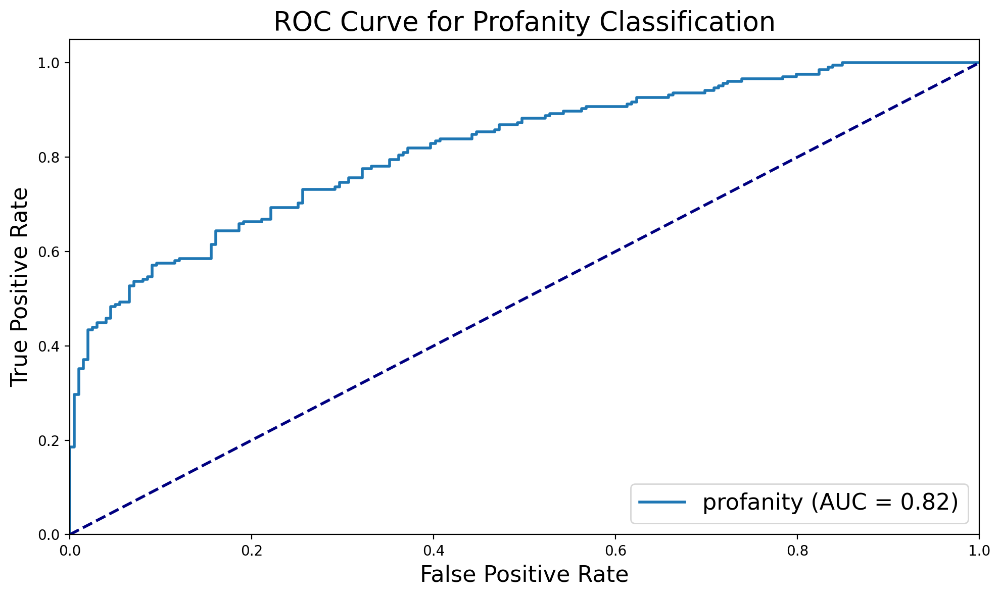

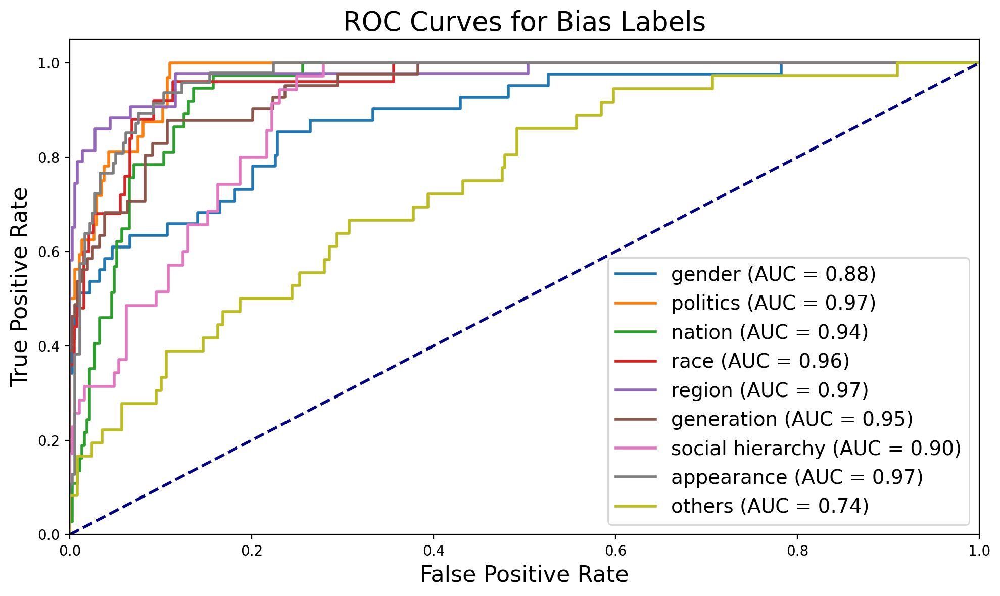

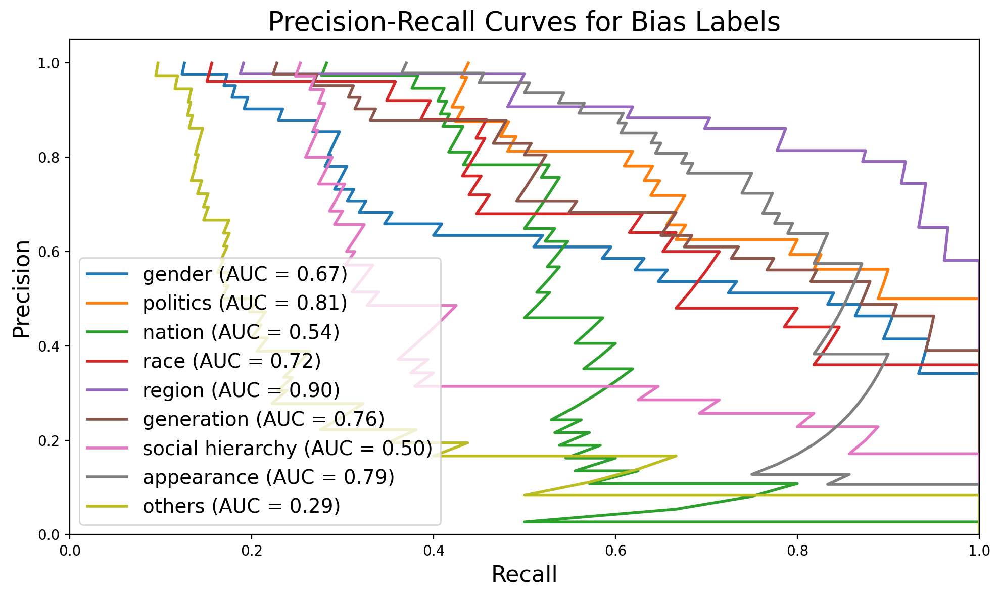


Eval results for Preference.
accuracy : 42.57
f1-macro : 35.83
preference_mae:0.8292079207920792
preference_top2_accuracy:0.7202970385551453
preference_top2_f1:0.4708446861981942

Eval results for Slang.
accuracy : 72.77
precision : 80.25
recall : 61.46
f1 : 69.61
matthews_corrcoef : 47.06
pr_auc : 0.8473800549660975
roc_auc : 0.8194386566981249

Eval results for Gender.
accuracy : 73.02
precision : 25.71
recall : 87.8
f1 : 39.78
matthews_corrcoef : 37.54
pr_auc : 0.6695656431070197
roc_auc : 0.8842975206611571

Eval results for Politic.
accuracy : 80.69
precision : 29.09
recall : 100.0
f1 : 45.07
matthews_corrcoef : 47.95
pr_auc : 0.8122228062389472
roc_auc : 0.9743783602150538

Eval results for Nation.
accuracy : 83.91
precision : 36.0
recall : 97.3
f1 : 52.55
matthews_corrcoef : 53.37
pr_auc : 0.5402398588339556
roc_auc : 0.9430738640547905

Eval results for Race.
accuracy : 81.93
precision : 25.0
recall : 96.0
f1 : 39.67
matthews_corrcoef : 43.59
pr_auc : 0.7181806318080766
roc_au

epoch: 2, train loss: 9.3647: 100%|██████████████████████████████████████| 3836/3836 [34:47<00:00,  1.84it/s]


Preference Accuracy per class
Class 1: 67.85%
Class 2: 32.57%
Class 3: 72.85%
Class 4: 15.94%
Class 5: 14.50%


epoch: 2, valid loss: 11.486: 100%|████████████████████████████████████████| 101/101 [00:10<00:00,  9.38it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 34.62%
Class 3: 67.33%
Class 4: 21.74%
Class 5: 9.46%


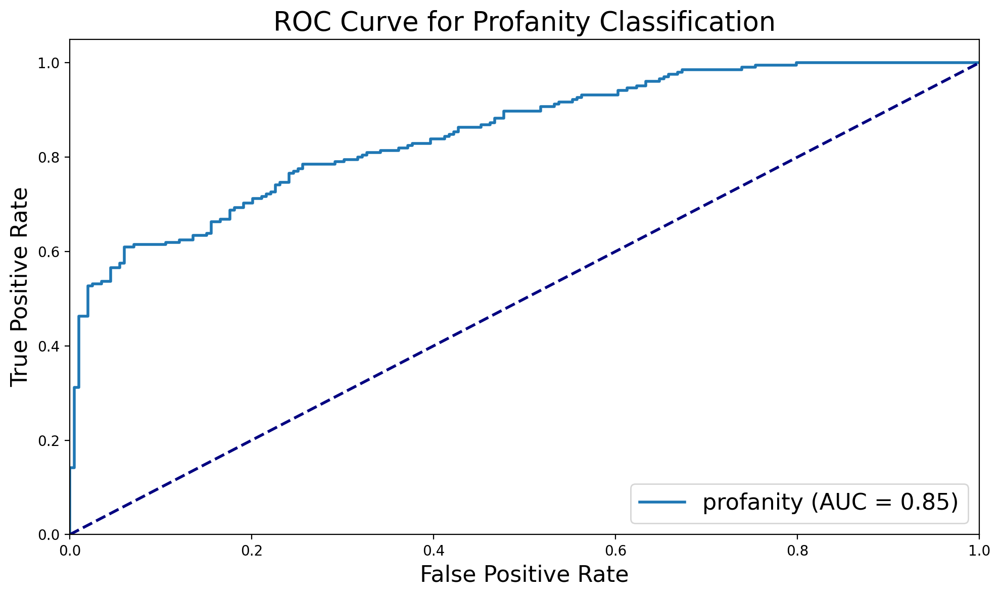

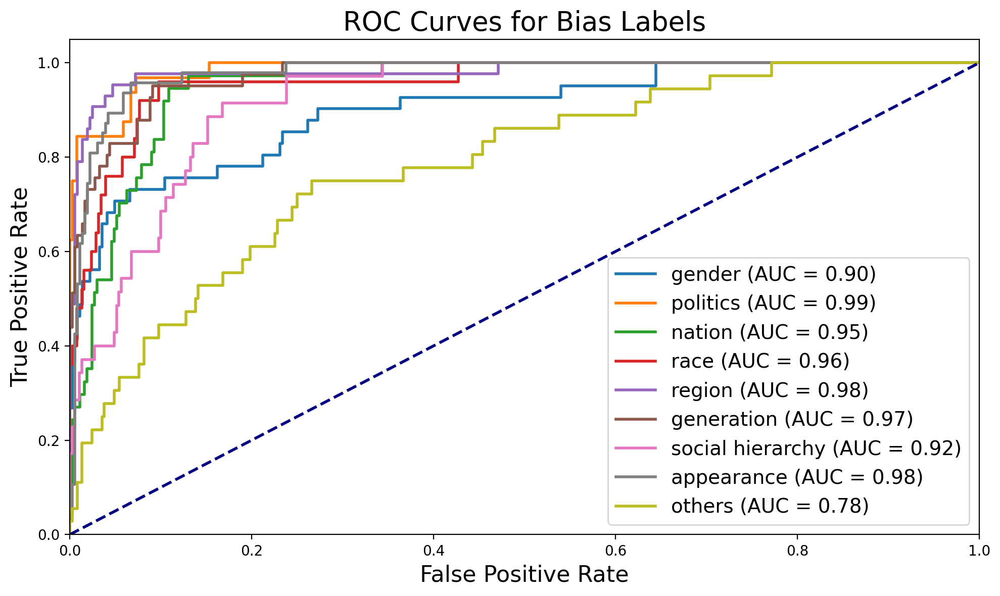

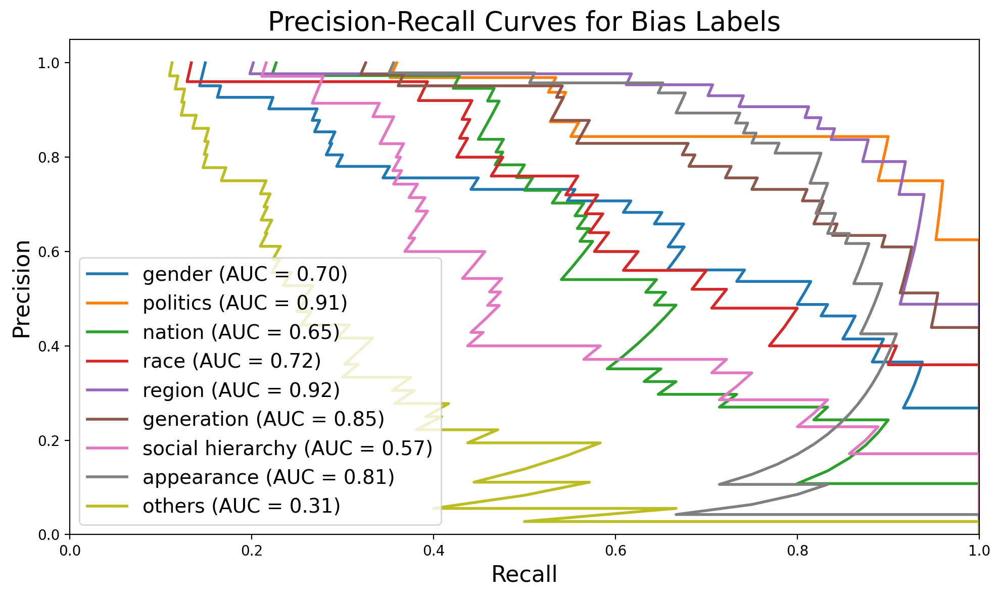


Eval results for Preference.
accuracy : 46.04
f1-macro : 40.36
preference_mae:0.7277227722772277
preference_top2_accuracy:0.7722772359848022
preference_top2_f1:0.5147583046726529

Eval results for Slang.
accuracy : 74.75
precision : 84.11
recall : 61.95
f1 : 71.35
matthews_corrcoef : 51.56
pr_auc : 0.8722816203938868
roc_auc : 0.8500061282019855

Eval results for Gender.
accuracy : 88.12
precision : 44.78
recall : 73.17
f1 : 55.56
matthews_corrcoef : 51.13
pr_auc : 0.7011200002867228
roc_auc : 0.9008264462809917

Eval results for Politic.
accuracy : 88.12
precision : 39.74
recall : 96.88
f1 : 56.36
matthews_corrcoef : 57.64
pr_auc : 0.9070368965769942
roc_auc : 0.9858030913978495

Eval results for Nation.
accuracy : 89.36
precision : 45.71
recall : 86.49
f1 : 59.81
matthews_corrcoef : 58.02
pr_auc : 0.6469237502488792
roc_auc : 0.9505118197216291

Eval results for Race.
accuracy : 86.39
precision : 30.77
recall : 96.0
f1 : 46.6
matthews_corrcoef : 49.9
pr_auc : 0.723177775855453
roc_a

epoch: 3, train loss: 8.7765: 100%|██████████████████████████████████████| 3836/3836 [35:46<00:00,  1.79it/s]


Preference Accuracy per class
Class 1: 67.88%
Class 2: 37.71%
Class 3: 72.59%
Class 4: 20.86%
Class 5: 17.33%


epoch: 3, valid loss: 11.8557: 100%|███████████████████████████████████████| 101/101 [00:11<00:00,  9.17it/s]


Preference Accuracy per class
Class 1: 85.37%
Class 2: 46.15%
Class 3: 68.32%
Class 4: 17.39%
Class 5: 18.92%


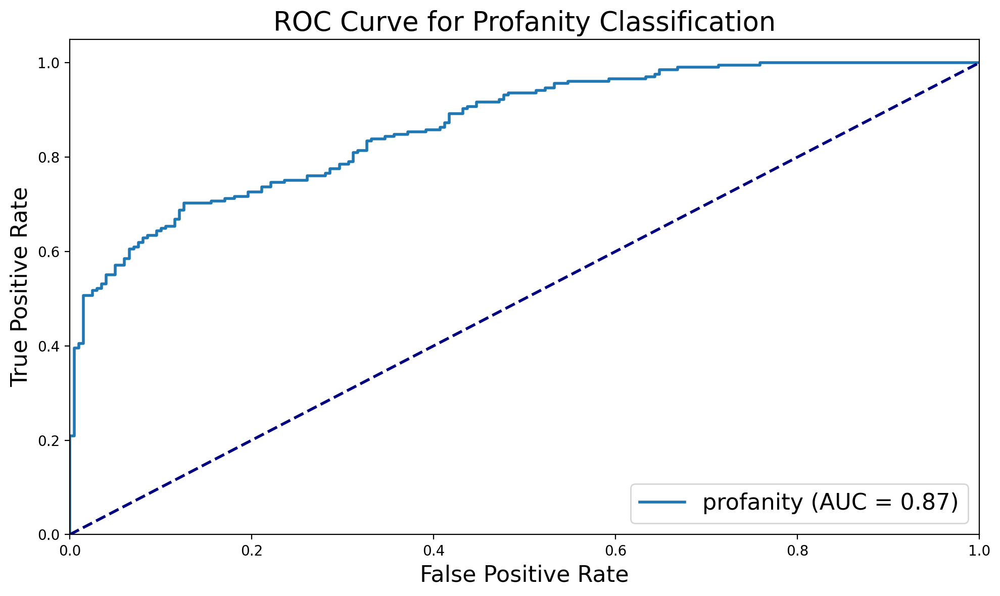

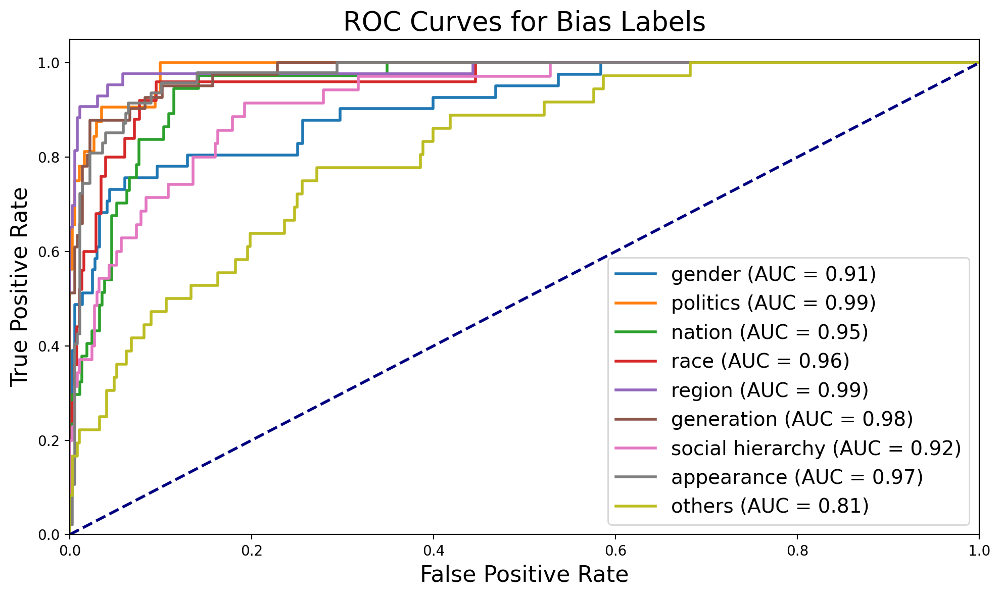

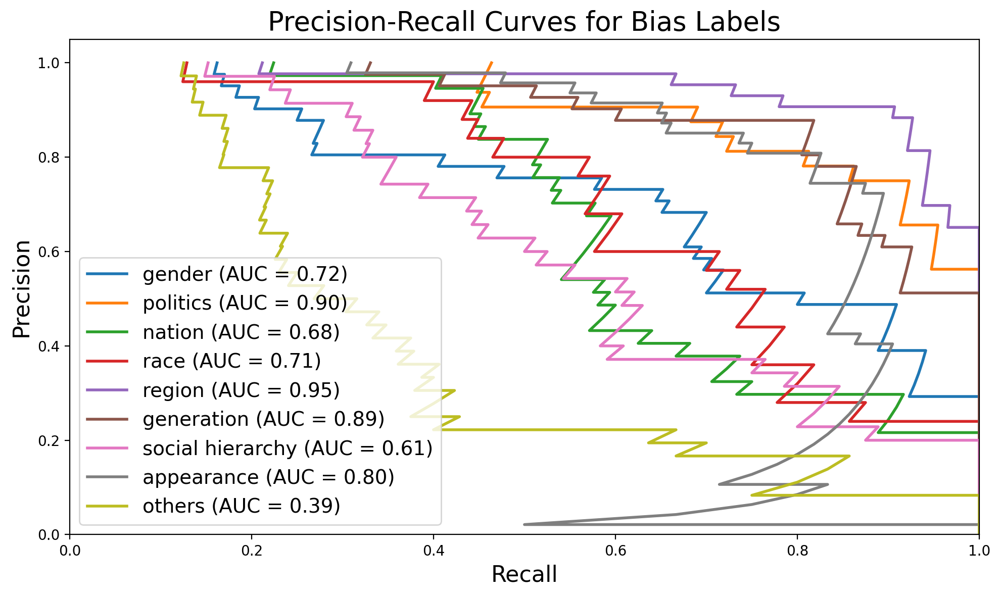


Eval results for Preference.
accuracy : 49.75
f1-macro : 45.04
preference_mae:0.6782178217821783
preference_top2_accuracy:0.7920792102813721
preference_top2_f1:0.5329421156396227

Eval results for Slang.
accuracy : 77.48
precision : 85.62
recall : 66.83
f1 : 75.07
matthews_corrcoef : 56.5
pr_auc : 0.8843850526906565
roc_auc : 0.8660620174040935

Eval results for Gender.
accuracy : 89.36
precision : 48.44
recall : 75.61
f1 : 59.05
matthews_corrcoef : 55.01
pr_auc : 0.7210488179947552
roc_auc : 0.9103675334274004

Eval results for Politic.
accuracy : 90.84
precision : 46.38
recall : 100.0
f1 : 63.37
matthews_corrcoef : 64.63
pr_auc : 0.899157506772215
roc_auc : 0.986391129032258

Eval results for Nation.
accuracy : 89.11
precision : 45.07
recall : 86.49
f1 : 59.26
matthews_corrcoef : 57.49
pr_auc : 0.675774989600496
roc_auc : 0.9513955372265999

Eval results for Race.
accuracy : 89.85
precision : 37.5
recall : 96.0
f1 : 53.93
matthews_corrcoef : 56.38
pr_auc : 0.7088095080608637
roc_auc

epoch: 4, train loss: 8.3023: 100%|██████████████████████████████████████| 3836/3836 [35:57<00:00,  1.78it/s]


Preference Accuracy per class
Class 1: 70.03%
Class 2: 41.68%
Class 3: 72.61%
Class 4: 24.93%
Class 5: 22.22%


epoch: 4, valid loss: 10.8828: 100%|███████████████████████████████████████| 101/101 [00:10<00:00,  9.28it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 57.69%
Class 3: 61.39%
Class 4: 26.09%
Class 5: 27.03%


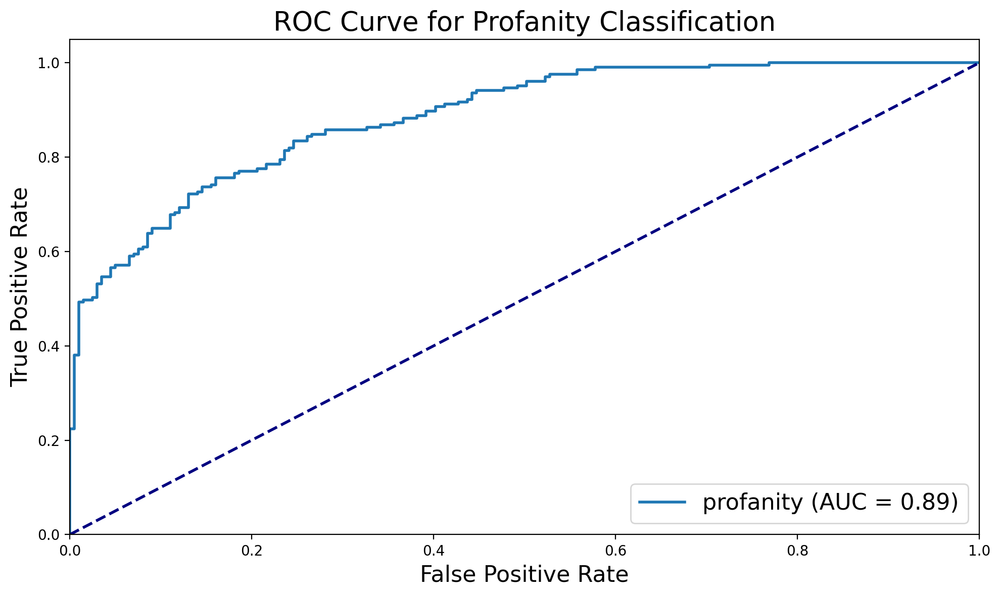

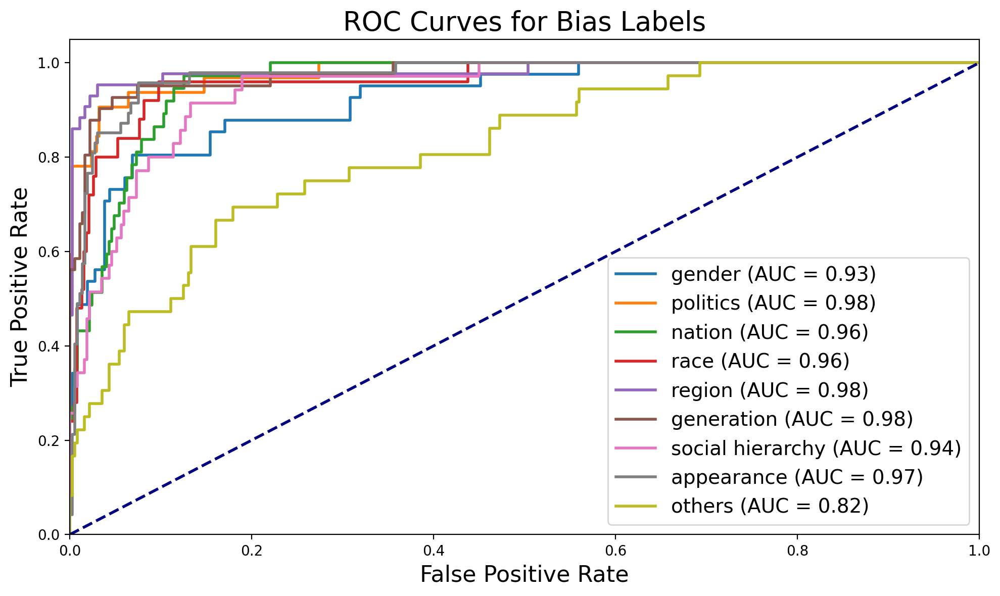

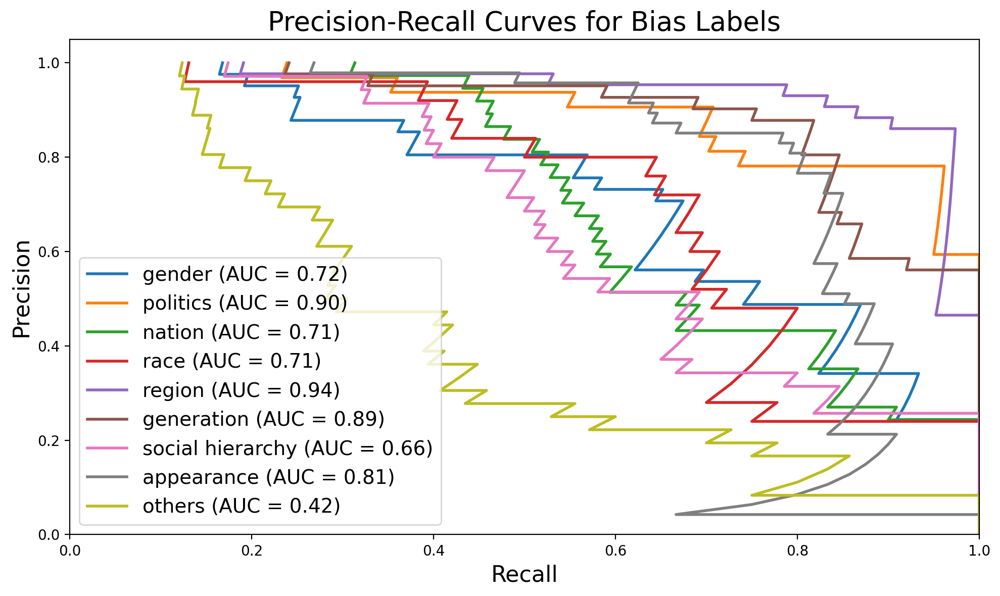


Eval results for Preference.
accuracy : 53.71
f1-macro : 50.56
preference_mae:0.6188118811881188
preference_top2_accuracy:0.8217821717262268
preference_top2_f1:0.5564600681337968

Eval results for Slang.
accuracy : 78.96
precision : 84.09
recall : 72.2
f1 : 77.69
matthews_corrcoef : 58.61
pr_auc : 0.8971644849911511
roc_auc : 0.8853781100625077

Eval results for Gender.
accuracy : 89.11
precision : 47.83
recall : 80.49
f1 : 60.0
matthews_corrcoef : 56.63
pr_auc : 0.7182367962642752
roc_auc : 0.9261573607471612

Eval results for Politic.
accuracy : 92.08
precision : 50.0
recall : 93.75
f1 : 65.22
matthews_corrcoef : 65.07
pr_auc : 0.8977207312708712
roc_auc : 0.9805947580645161

Eval results for Nation.
accuracy : 89.36
precision : 45.71
recall : 86.49
f1 : 59.81
matthews_corrcoef : 58.02
pr_auc : 0.7117671047722085
roc_auc : 0.9588334928934383

Eval results for Race.
accuracy : 89.11
precision : 35.82
recall : 96.0
f1 : 52.17
matthews_corrcoef : 54.84
pr_auc : 0.7146070557524649
roc_a

epoch: 5, train loss: 7.7589: 100%|██████████████████████████████████████| 3836/3836 [35:45<00:00,  1.79it/s]


Preference Accuracy per class
Class 1: 69.32%
Class 2: 43.66%
Class 3: 72.77%
Class 4: 28.26%
Class 5: 25.61%


epoch: 5, valid loss: 10.0445: 100%|███████████████████████████████████████| 101/101 [00:11<00:00,  9.15it/s]


Preference Accuracy per class
Class 1: 91.46%
Class 2: 51.28%
Class 3: 55.45%
Class 4: 26.09%
Class 5: 35.14%


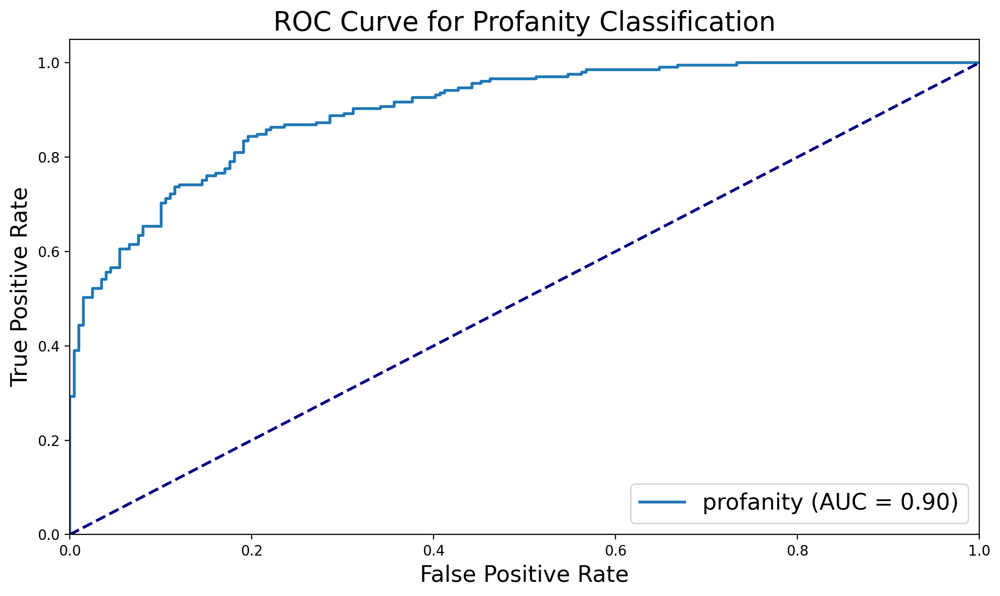

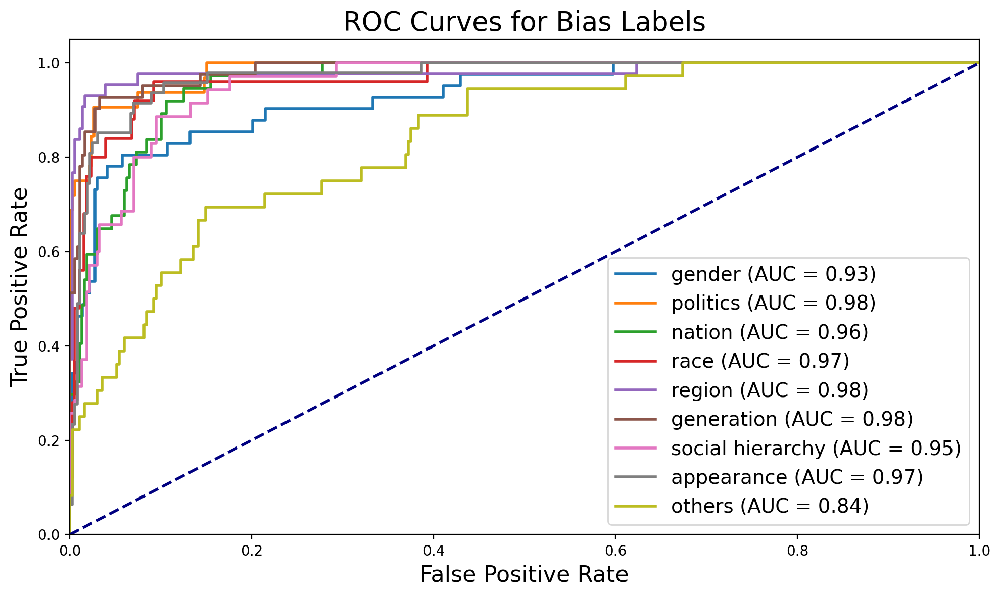

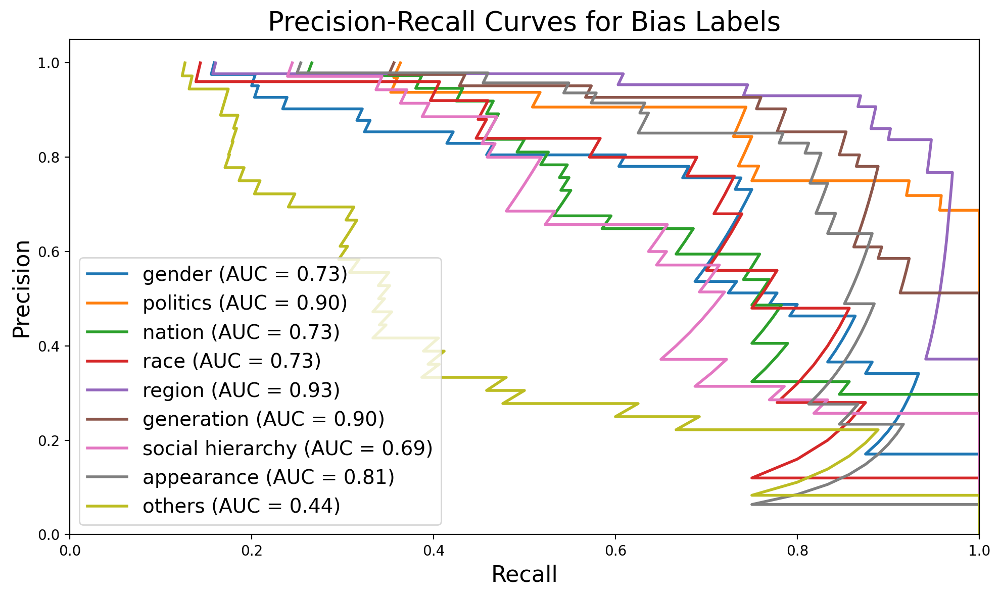


Eval results for Preference.
accuracy : 53.22
f1-macro : 50.5
preference_mae:0.6361386138613861
preference_top2_accuracy:0.8193069100379944
preference_top2_f1:0.5591802512213295

Eval results for Slang.
accuracy : 81.44
precision : 82.18
recall : 80.98
f1 : 81.57
matthews_corrcoef : 62.88
pr_auc : 0.9095343465324384
roc_auc : 0.9010417943375414

Eval results for Gender.
accuracy : 88.61
precision : 46.48
recall : 80.49
f1 : 58.93
matthews_corrcoef : 55.55
pr_auc : 0.7331784517720065
roc_auc : 0.929584089229322

Eval results for Politic.
accuracy : 88.86
precision : 41.1
recall : 93.75
f1 : 57.14
matthews_corrcoef : 57.69
pr_auc : 0.9006702757019527
roc_auc : 0.9842069892473119

Eval results for Nation.
accuracy : 89.6
precision : 46.27
recall : 83.78
f1 : 59.62
matthews_corrcoef : 57.37
pr_auc : 0.731914127106409
roc_auc : 0.95868620664261

Eval results for Race.
accuracy : 90.84
precision : 40.0
recall : 96.0
f1 : 56.47
matthews_corrcoef : 58.61
pr_auc : 0.7303519649405213
roc_auc : 

epoch: 6, train loss: 7.5558: 100%|██████████████████████████████████████| 3836/3836 [35:56<00:00,  1.78it/s]


Preference Accuracy per class
Class 1: 69.61%
Class 2: 45.90%
Class 3: 72.15%
Class 4: 32.22%
Class 5: 35.59%


epoch: 6, valid loss: 9.7279: 100%|████████████████████████████████████████| 101/101 [00:10<00:00,  9.26it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 60.26%
Class 3: 52.48%
Class 4: 42.03%
Class 5: 37.84%


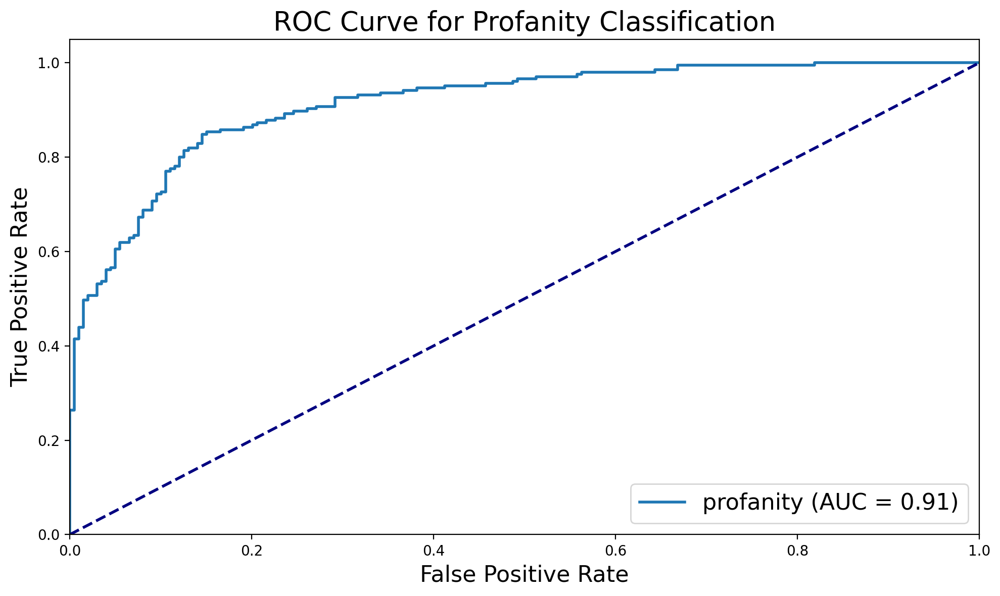

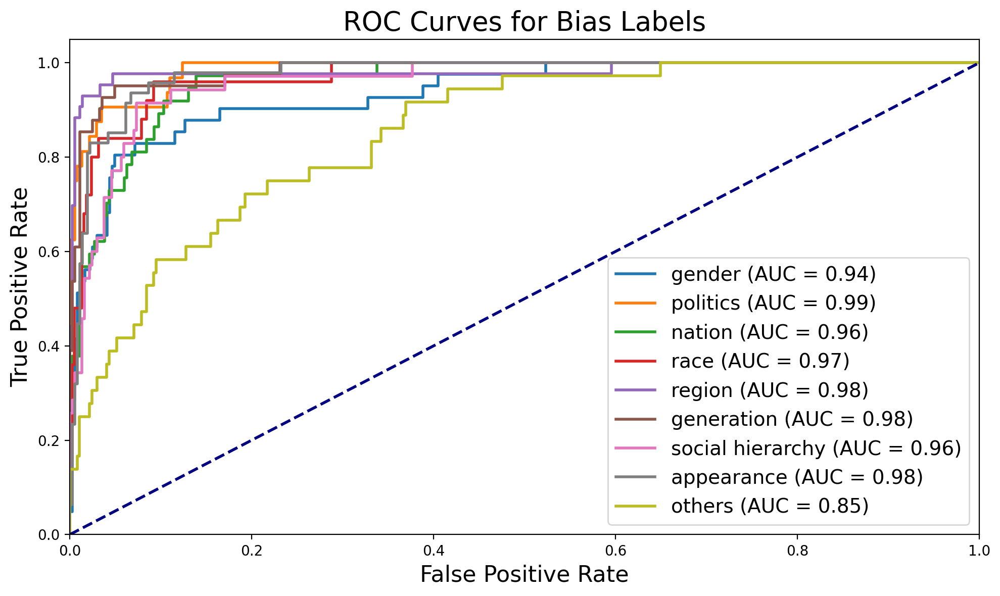

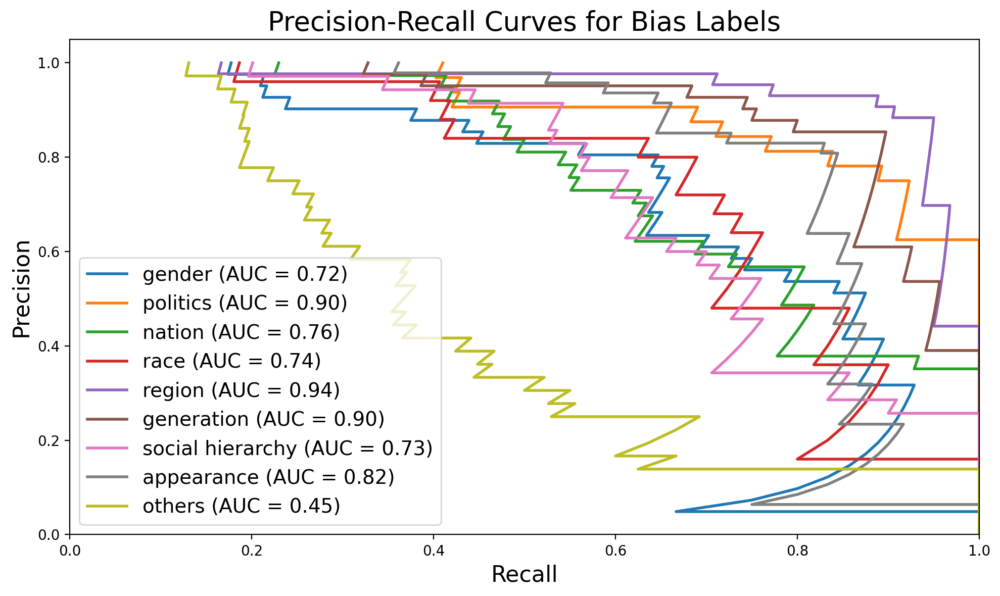


Eval results for Preference.
accuracy : 56.68
f1-macro : 55.2
preference_mae:0.5668316831683168
preference_top2_accuracy:0.8490098714828491
preference_top2_f1:0.5780583065246468

Eval results for Slang.
accuracy : 83.91
precision : 85.71
recall : 81.95
f1 : 83.79
matthews_corrcoef : 67.9
pr_auc : 0.9199621492346954
roc_auc : 0.9135923520039221

Eval results for Gender.
accuracy : 89.36
precision : 48.57
recall : 82.93
f1 : 61.26
matthews_corrcoef : 58.25
pr_auc : 0.7178367470641613
roc_auc : 0.9359672109117786

Eval results for Politic.
accuracy : 91.09
precision : 46.77
recall : 90.62
f1 : 61.7
matthews_corrcoef : 61.26
pr_auc : 0.9005968052360418
roc_auc : 0.9852990591397849

Eval results for Nation.
accuracy : 90.84
precision : 50.0
recall : 83.78
f1 : 62.63
matthews_corrcoef : 60.29
pr_auc : 0.7588500533739728
roc_auc : 0.9601590691508948

Eval results for Race.
accuracy : 91.58
precision : 41.82
recall : 92.0
f1 : 57.5
matthews_corrcoef : 58.71
pr_auc : 0.7445858064504711
roc_auc

epoch: 7, train loss: 6.8432: 100%|██████████████████████████████████████| 3836/3836 [36:04<00:00,  1.77it/s]


Preference Accuracy per class
Class 1: 70.35%
Class 2: 47.77%
Class 3: 71.53%
Class 4: 40.36%
Class 5: 35.59%


epoch: 7, valid loss: 10.535: 100%|████████████████████████████████████████| 101/101 [00:11<00:00,  9.03it/s]


Preference Accuracy per class
Class 1: 90.24%
Class 2: 55.13%
Class 3: 60.40%
Class 4: 56.52%
Class 5: 33.78%


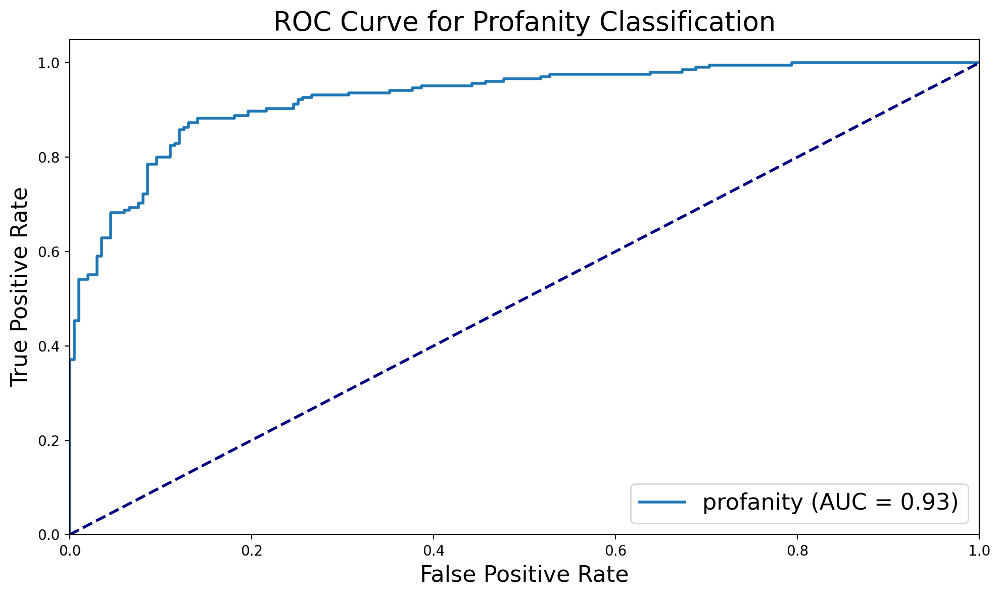

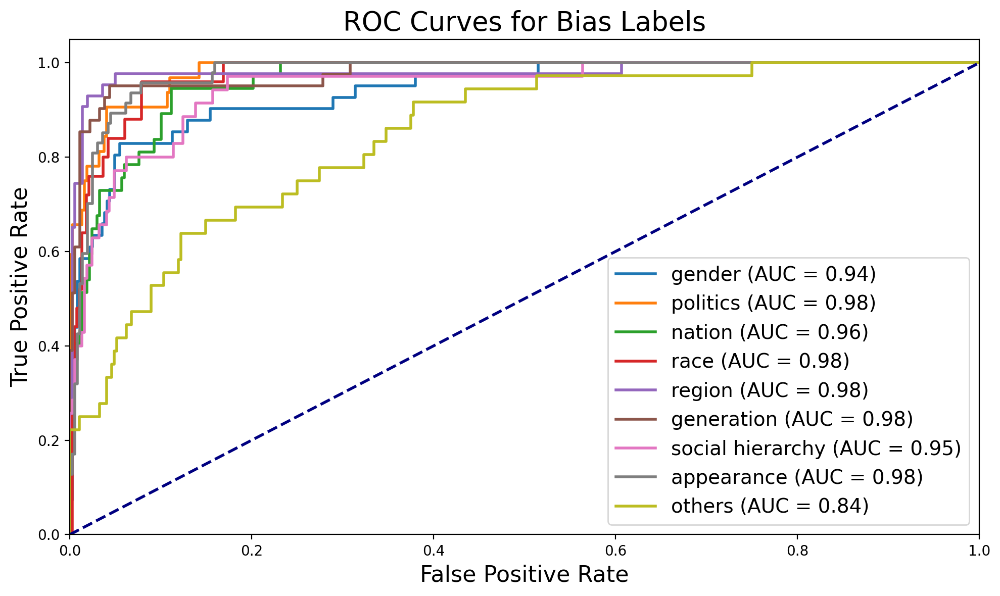

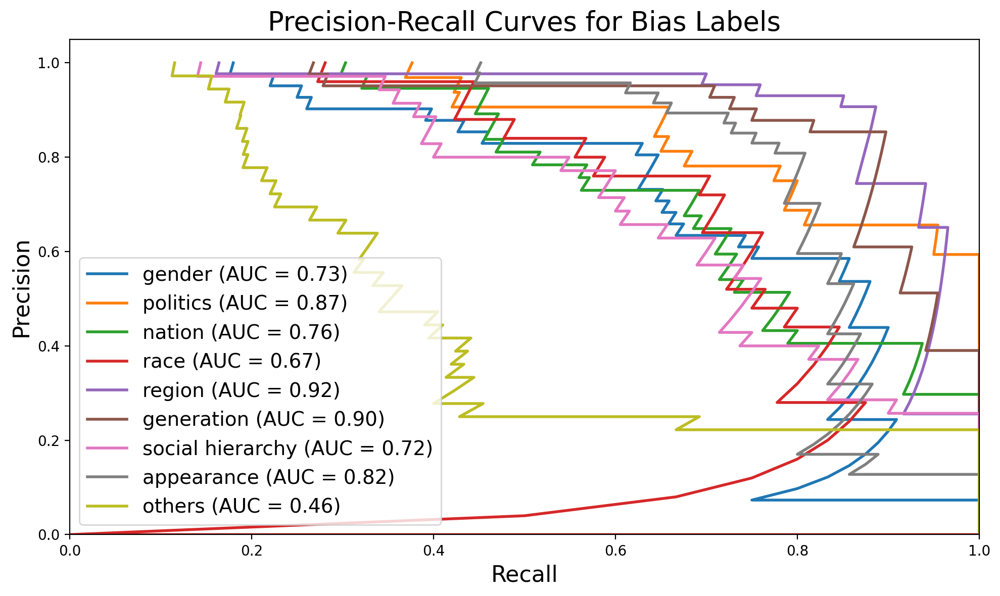


Eval results for Preference.
accuracy : 59.9
f1-macro : 58.22
preference_mae:0.5222772277227723
preference_top2_accuracy:0.8663366436958313
preference_top2_f1:0.5902251300898488

Eval results for Slang.
accuracy : 86.39
precision : 87.88
recall : 84.88
f1 : 86.35
matthews_corrcoef : 72.82
pr_auc : 0.9352671696703141
roc_auc : 0.9266821914450301

Eval results for Gender.
accuracy : 91.83
precision : 56.67
recall : 82.93
f1 : 67.33
matthews_corrcoef : 64.34
pr_auc : 0.7318117239537506
roc_auc : 0.9408721359940873

Eval results for Politic.
accuracy : 93.07
precision : 53.7
recall : 90.62
f1 : 67.44
matthews_corrcoef : 66.59
pr_auc : 0.873114779545598
roc_auc : 0.9818548387096775

Eval results for Nation.
accuracy : 89.85
precision : 46.97
recall : 83.78
f1 : 60.19
matthews_corrcoef : 57.93
pr_auc : 0.7592927939497092
roc_auc : 0.9617792179100081

Eval results for Race.
accuracy : 91.09
precision : 40.68
recall : 96.0
f1 : 57.14
matthews_corrcoef : 59.2
pr_auc : 0.6709031778934851
roc_au

epoch: 8, train loss: 6.6574: 100%|██████████████████████████████████████| 3836/3836 [36:06<00:00,  1.77it/s]


Preference Accuracy per class
Class 1: 70.82%
Class 2: 48.44%
Class 3: 72.07%
Class 4: 43.47%
Class 5: 37.10%


epoch: 8, valid loss: 10.0355: 100%|███████████████████████████████████████| 101/101 [00:10<00:00,  9.24it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 60.26%
Class 3: 61.39%
Class 4: 46.38%
Class 5: 52.70%


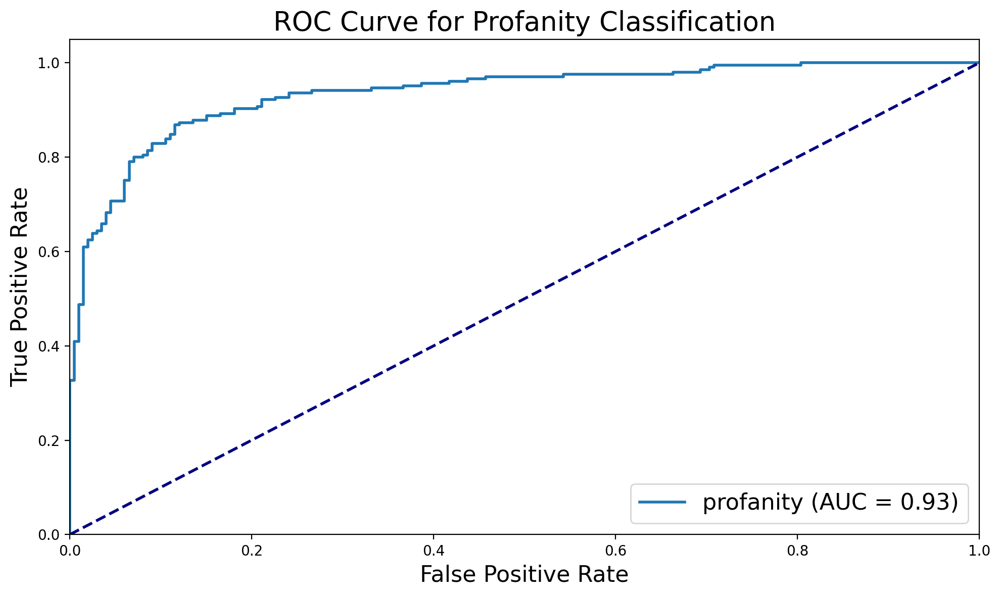

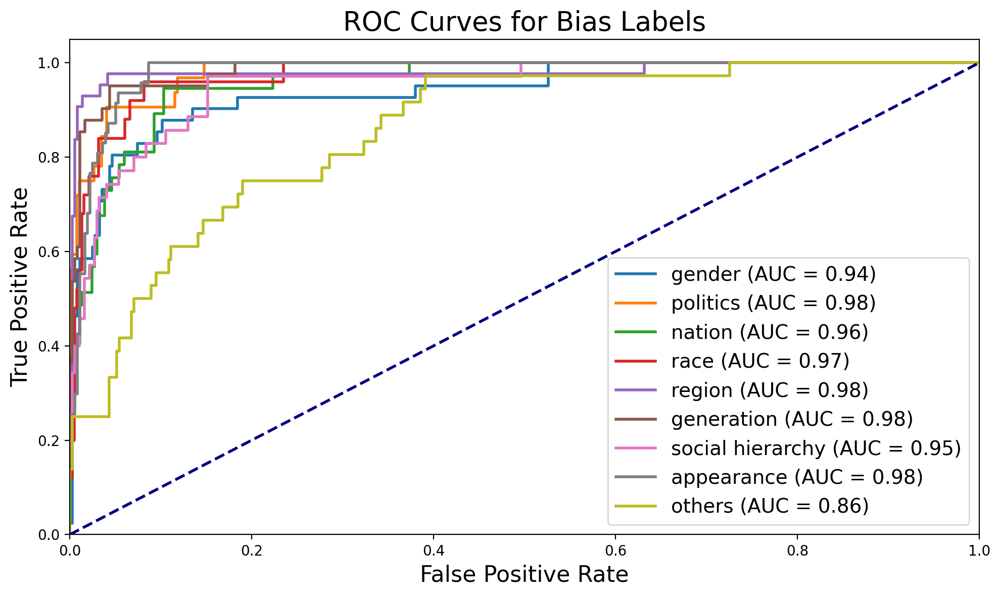

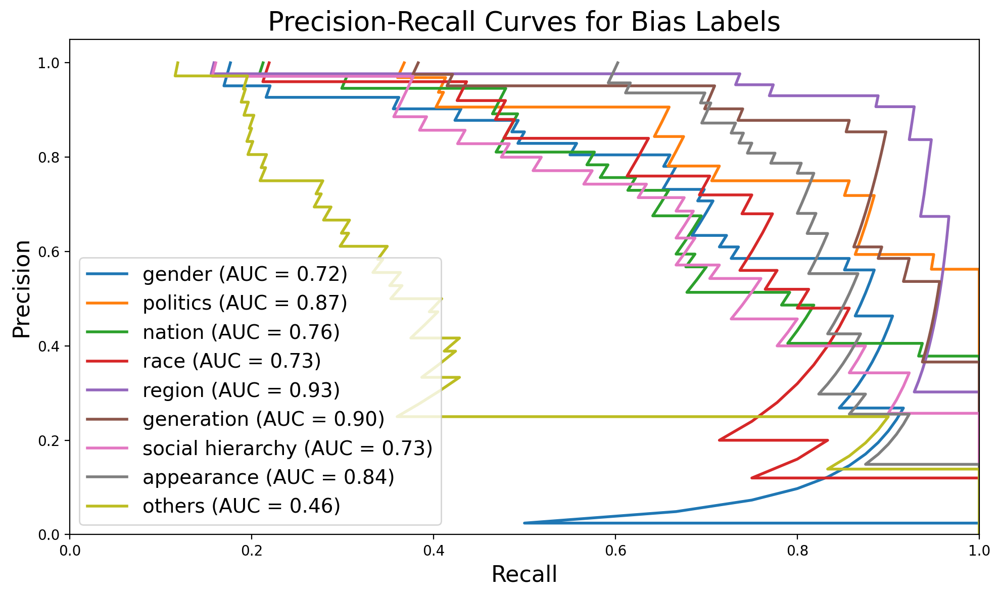


Eval results for Preference.
accuracy : 62.38
f1-macro : 61.43
preference_mae:0.5074257425742574
preference_top2_accuracy:0.8787128925323486
preference_top2_f1:0.5988714604613544

Eval results for Slang.
accuracy : 86.39
precision : 88.66
recall : 83.9
f1 : 86.22
matthews_corrcoef : 72.9
pr_auc : 0.9425209958034038
roc_auc : 0.9348449564897658

Eval results for Gender.
accuracy : 91.09
precision : 53.97
recall : 82.93
f1 : 65.38
matthews_corrcoef : 62.37
pr_auc : 0.723876662602316
roc_auc : 0.9399314654303568

Eval results for Politic.
accuracy : 93.81
precision : 56.86
recall : 90.62
f1 : 69.88
matthews_corrcoef : 68.88
pr_auc : 0.8696120580107285
roc_auc : 0.9810987903225807

Eval results for Nation.
accuracy : 90.1
precision : 47.62
recall : 81.08
f1 : 60.0
matthews_corrcoef : 57.31
pr_auc : 0.7626313120236248
roc_auc : 0.9585389203917813

Eval results for Race.
accuracy : 92.08
precision : 43.64
recall : 96.0
f1 : 60.0
matthews_corrcoef : 61.7
pr_auc : 0.7337163457639212
roc_auc :

epoch: 9, train loss: 6.6811: 100%|██████████████████████████████████████| 3836/3836 [35:51<00:00,  1.78it/s]


Preference Accuracy per class
Class 1: 69.67%
Class 2: 50.16%
Class 3: 71.46%
Class 4: 44.04%
Class 5: 43.13%


epoch: 9, valid loss: 9.6869: 100%|████████████████████████████████████████| 101/101 [00:10<00:00,  9.30it/s]


Preference Accuracy per class
Class 1: 89.02%
Class 2: 58.97%
Class 3: 55.45%
Class 4: 62.32%
Class 5: 45.95%


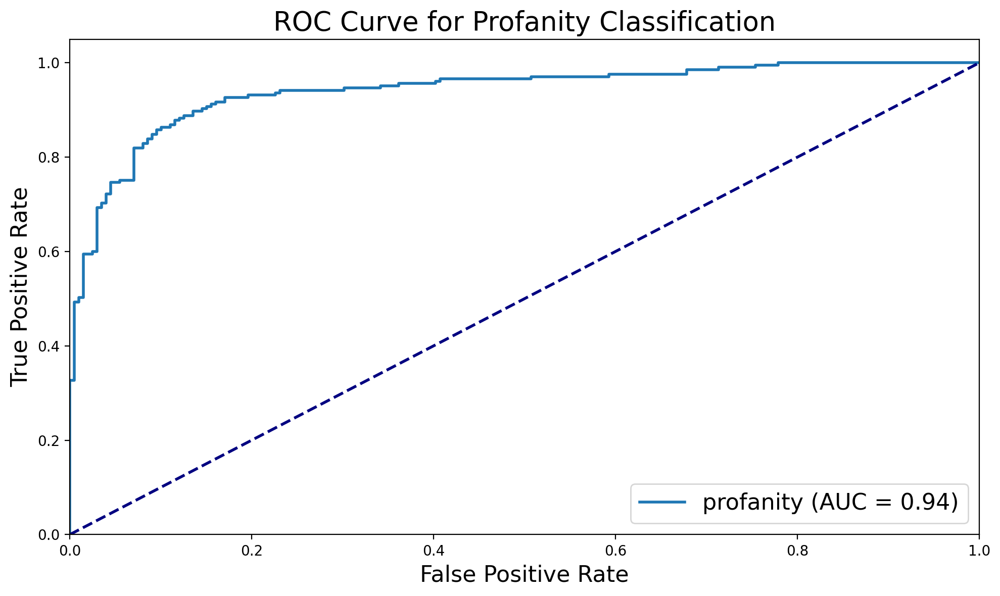

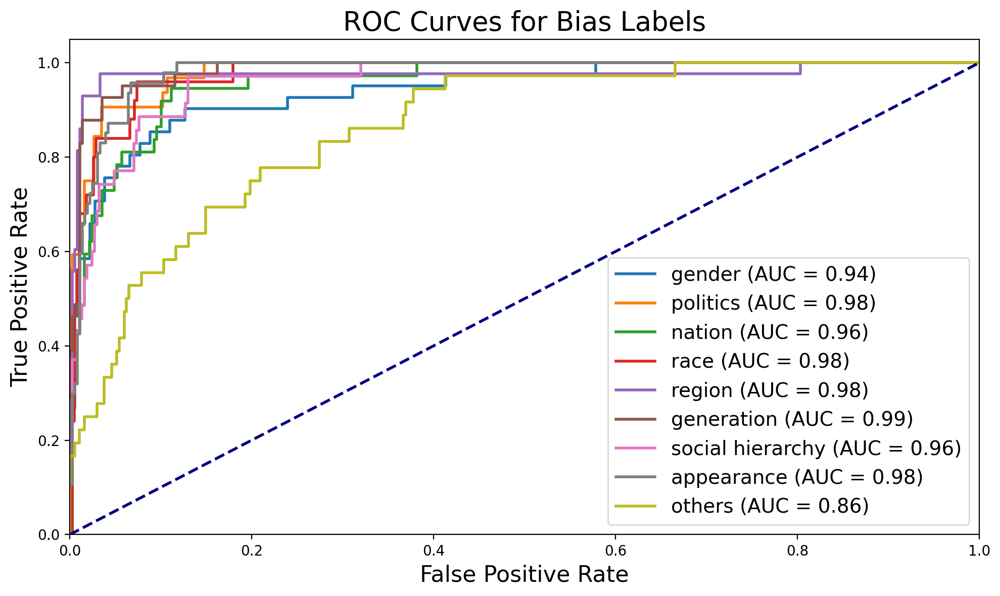

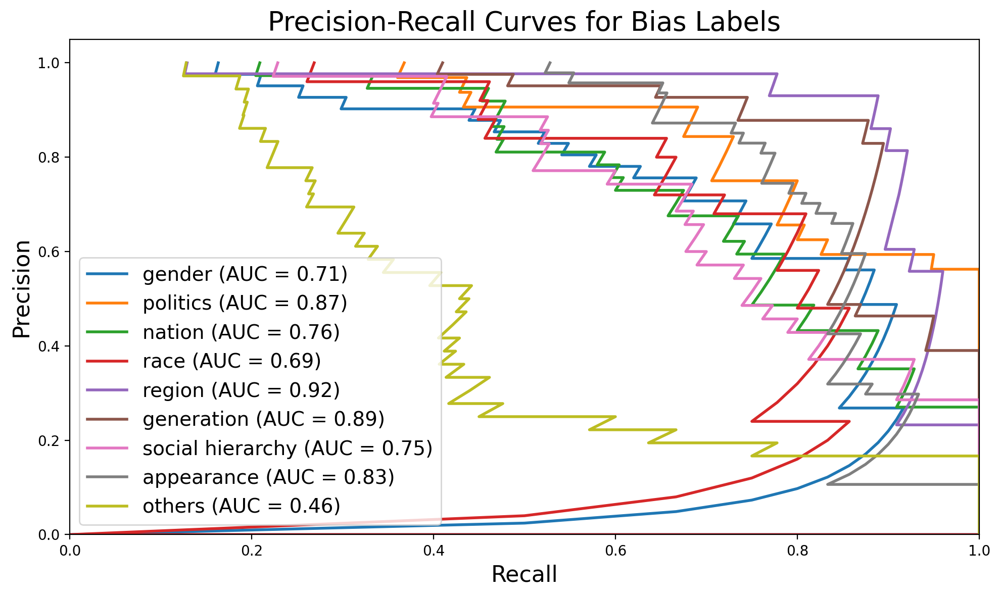


Eval results for Preference.
accuracy : 62.38
f1-macro : 61.72
preference_mae:0.48267326732673266
preference_top2_accuracy:0.8861386179924011
preference_top2_f1:0.6043413195847431

Eval results for Slang.
accuracy : 87.87
precision : 89.8
recall : 85.85
f1 : 87.78
matthews_corrcoef : 75.83
pr_auc : 0.9473507376161856
roc_auc : 0.9396984924623115

Eval results for Gender.
accuracy : 91.34
precision : 55.0
recall : 80.49
f1 : 65.35
matthews_corrcoef : 62.03
pr_auc : 0.7095745249306094
roc_auc : 0.9420143788214742

Eval results for Politic.
accuracy : 93.81
precision : 56.86
recall : 90.62
f1 : 69.88
matthews_corrcoef : 68.88
pr_auc : 0.8657396361821215
roc_auc : 0.9817708333333334

Eval results for Nation.
accuracy : 90.84
precision : 50.0
recall : 81.08
f1 : 61.86
matthews_corrcoef : 59.14
pr_auc : 0.7644278621529356
roc_auc : 0.9597172103984094

Eval results for Race.
accuracy : 92.57
precision : 44.9
recall : 88.0
f1 : 59.46
matthews_corrcoef : 59.69
pr_auc : 0.6871072590799296
roc_a

epoch: 10, train loss: 6.0811: 100%|█████████████████████████████████████| 3836/3836 [35:57<00:00,  1.78it/s]


Preference Accuracy per class
Class 1: 69.67%
Class 2: 52.12%
Class 3: 70.85%
Class 4: 51.89%
Class 5: 40.11%


epoch: 10, valid loss: 9.7065: 100%|███████████████████████████████████████| 101/101 [00:10<00:00,  9.29it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 61.54%
Class 3: 56.44%
Class 4: 65.22%
Class 5: 45.95%


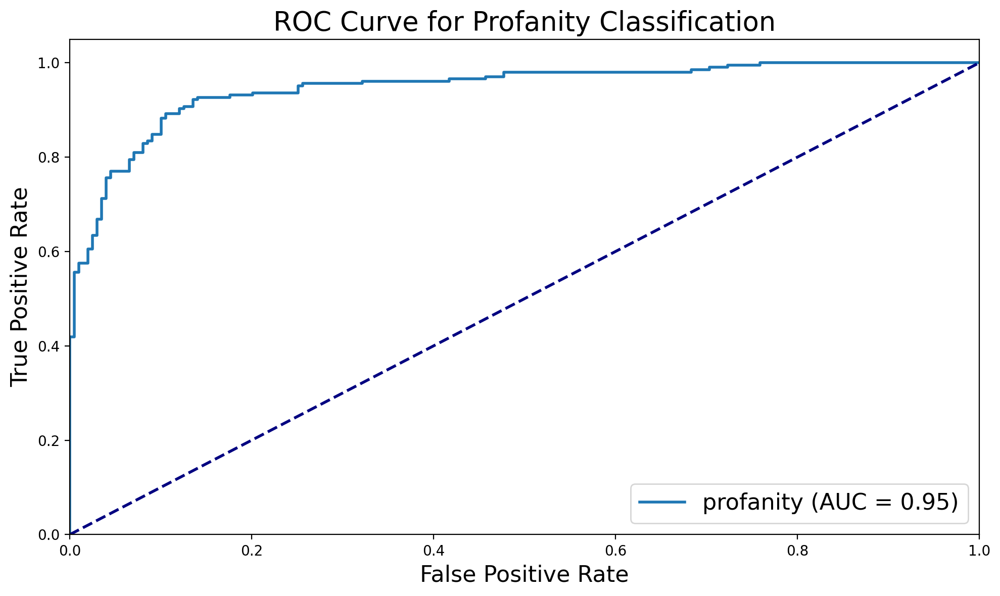

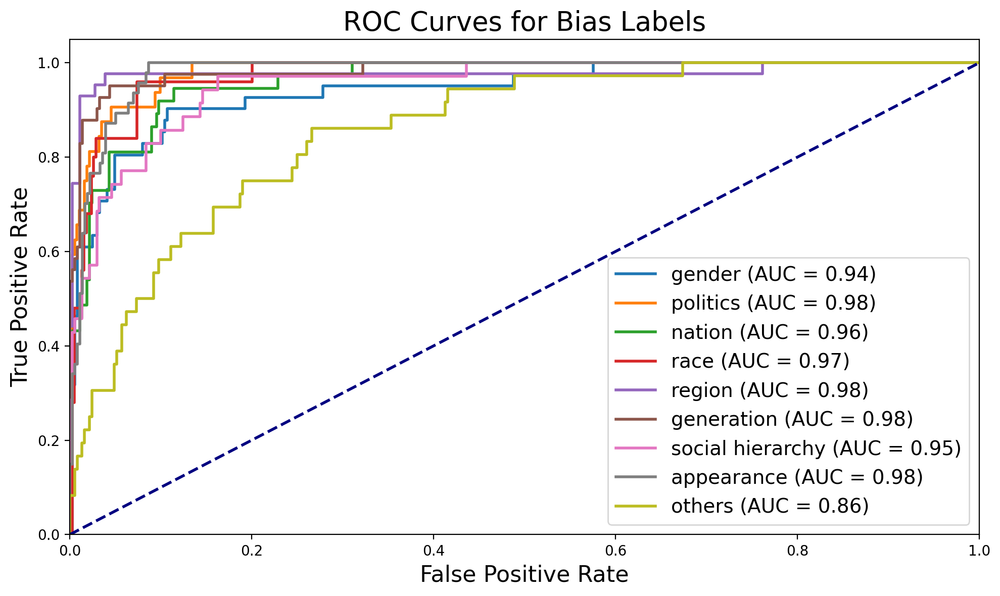

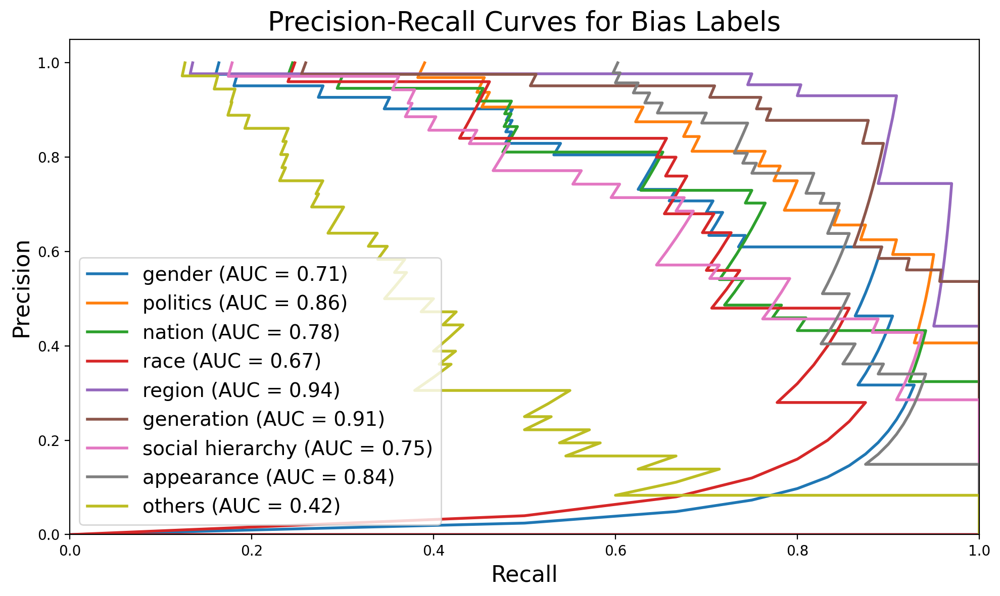


Eval results for Preference.
accuracy : 63.37
f1-macro : 62.78
preference_mae:0.46534653465346537
preference_top2_accuracy:0.8886138796806335
preference_top2_f1:0.6056170470788645

Eval results for Slang.
accuracy : 88.12
precision : 89.85
recall : 86.34
f1 : 88.06
matthews_corrcoef : 76.31
pr_auc : 0.9535868101272588
roc_auc : 0.9466846427258243

Eval results for Gender.
accuracy : 91.34
precision : 55.0
recall : 80.49
f1 : 65.35
matthews_corrcoef : 62.03
pr_auc : 0.7140664844179586
roc_auc : 0.9425519048578915

Eval results for Politic.
accuracy : 92.82
precision : 52.73
recall : 90.62
f1 : 66.67
matthews_corrcoef : 65.86
pr_auc : 0.8649813129444126
roc_auc : 0.9826948924731183

Eval results for Nation.
accuracy : 91.83
precision : 53.57
recall : 81.08
f1 : 64.52
matthews_corrcoef : 61.77
pr_auc : 0.7786879286101183
roc_auc : 0.9625156491641506

Eval results for Race.
accuracy : 92.57
precision : 45.28
recall : 96.0
f1 : 61.54
matthews_corrcoef : 63.05
pr_auc : 0.6703027924743157
ro

epoch: 11, train loss: 6.0748: 100%|█████████████████████████████████████| 3836/3836 [35:47<00:00,  1.79it/s]


Preference Accuracy per class
Class 1: 70.50%
Class 2: 53.05%
Class 3: 70.24%
Class 4: 53.02%
Class 5: 45.20%


epoch: 11, valid loss: 10.1293: 100%|██████████████████████████████████████| 101/101 [00:10<00:00,  9.20it/s]


Preference Accuracy per class
Class 1: 89.02%
Class 2: 62.82%
Class 3: 56.44%
Class 4: 63.77%
Class 5: 44.59%


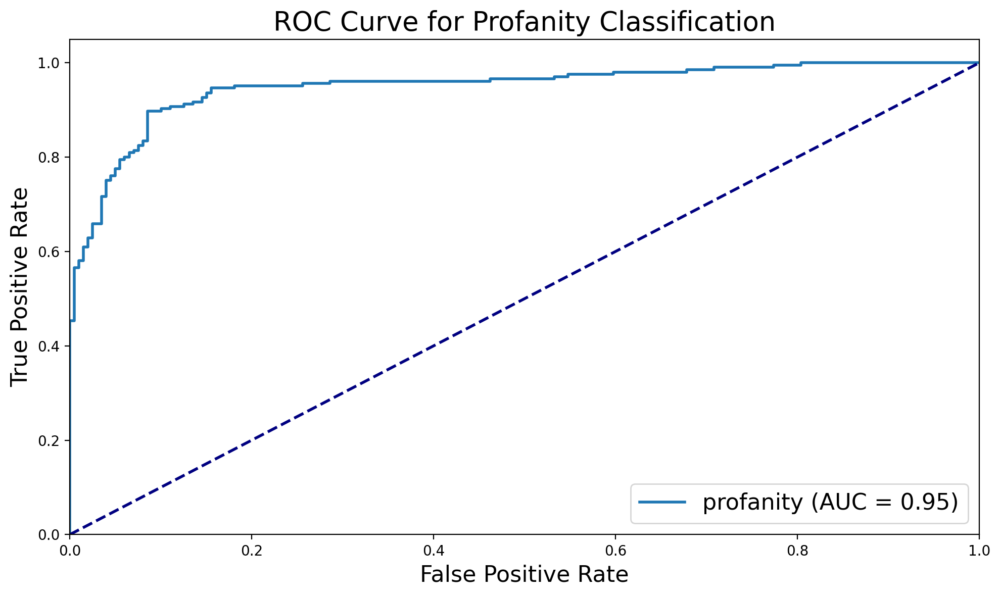

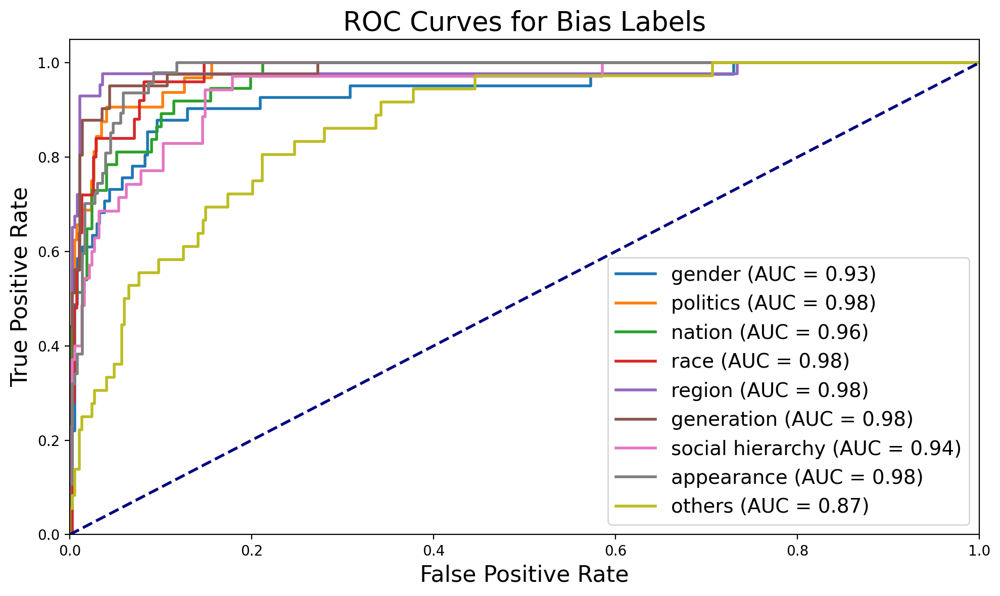

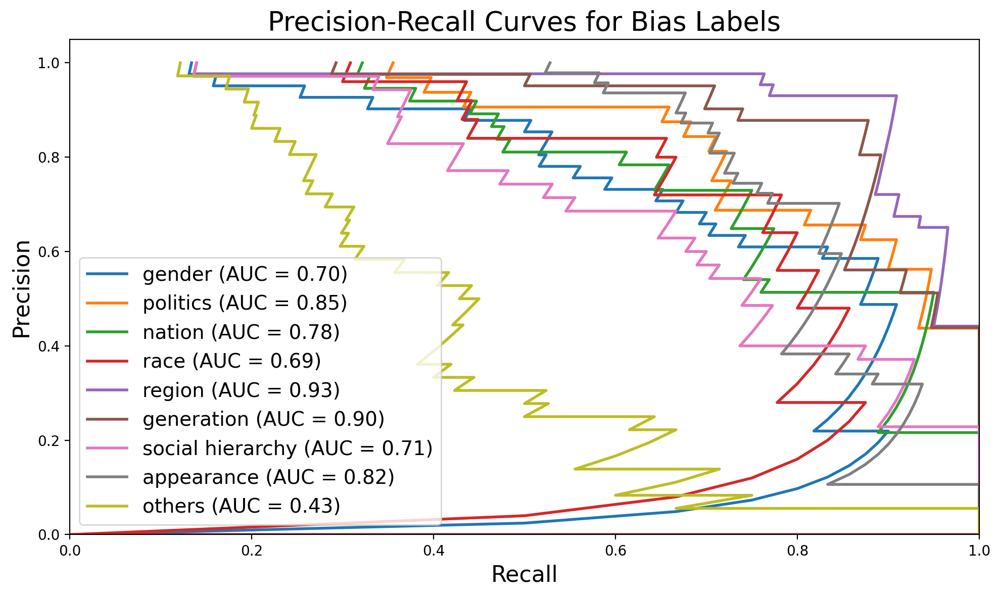


Eval results for Preference.
accuracy : 63.37
f1-macro : 62.66
preference_mae:0.46534653465346537
preference_top2_accuracy:0.8910890817642212
preference_top2_f1:0.6068198728332084

Eval results for Slang.
accuracy : 90.35
precision : 91.5
recall : 89.27
f1 : 90.37
matthews_corrcoef : 80.72
pr_auc : 0.9565455260096367
roc_auc : 0.9486701801691383

Eval results for Gender.
accuracy : 91.34
precision : 55.36
recall : 75.61
f1 : 63.92
matthews_corrcoef : 60.06
pr_auc : 0.6970334470577142
roc_auc : 0.9334139622387959

Eval results for Politic.
accuracy : 93.07
precision : 53.7
recall : 90.62
f1 : 67.44
matthews_corrcoef : 66.59
pr_auc : 0.8545327356516107
roc_auc : 0.9801747311827957

Eval results for Nation.
accuracy : 92.08
precision : 54.55
recall : 81.08
f1 : 65.22
matthews_corrcoef : 62.47
pr_auc : 0.7841449305160244
roc_auc : 0.9649458723028206

Eval results for Race.
accuracy : 91.83
precision : 42.59
recall : 92.0
f1 : 58.23
matthews_corrcoef : 59.35
pr_auc : 0.691342764074284
roc_

epoch: 12, train loss: 5.7446: 100%|█████████████████████████████████████| 3836/3836 [35:46<00:00,  1.79it/s]


Preference Accuracy per class
Class 1: 70.88%
Class 2: 52.48%
Class 3: 70.48%
Class 4: 55.57%
Class 5: 47.08%


epoch: 12, valid loss: 10.3229: 100%|██████████████████████████████████████| 101/101 [00:10<00:00,  9.19it/s]


Preference Accuracy per class
Class 1: 89.02%
Class 2: 64.10%
Class 3: 51.49%
Class 4: 59.42%
Class 5: 58.11%


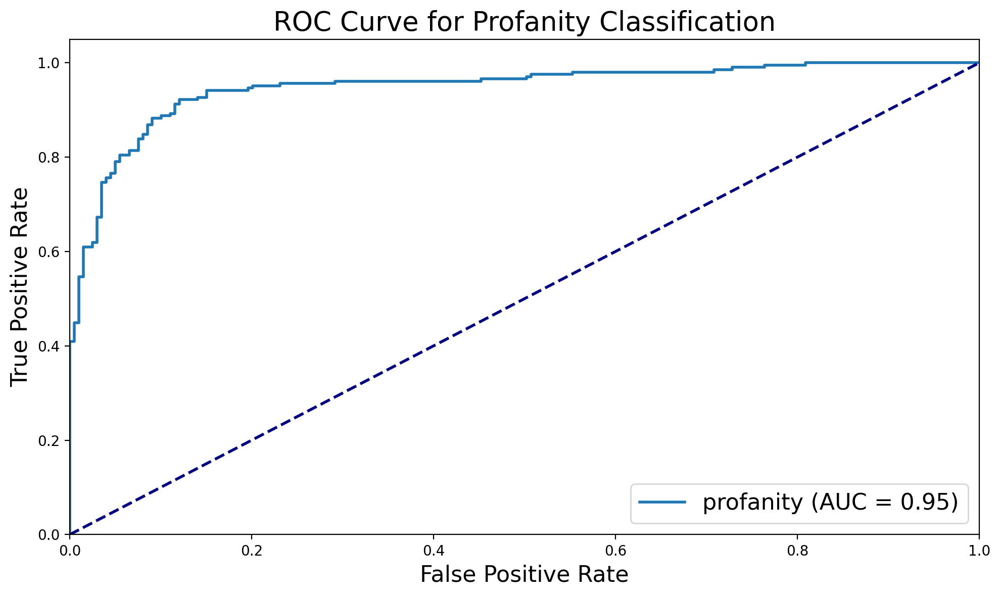

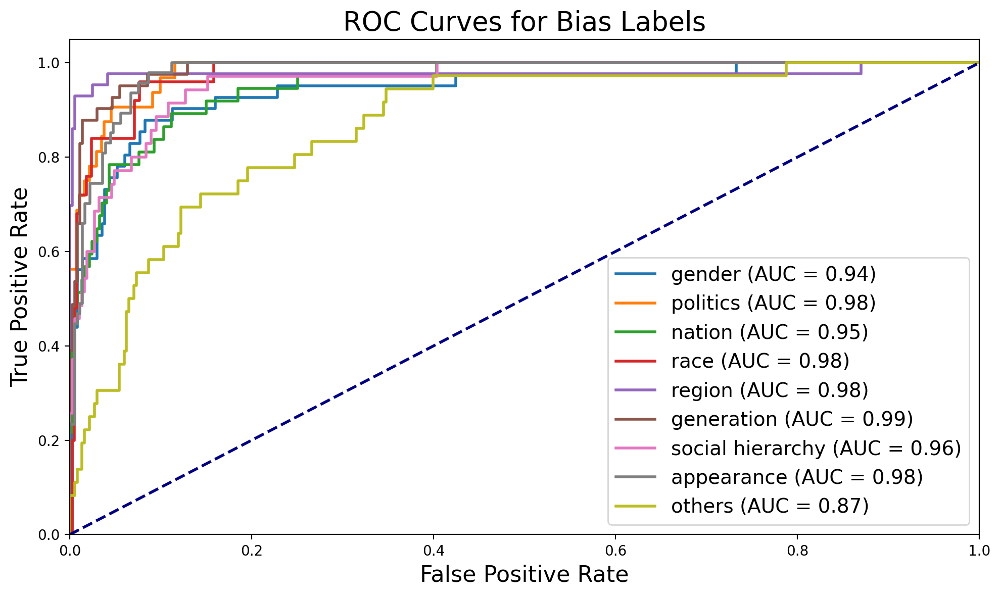

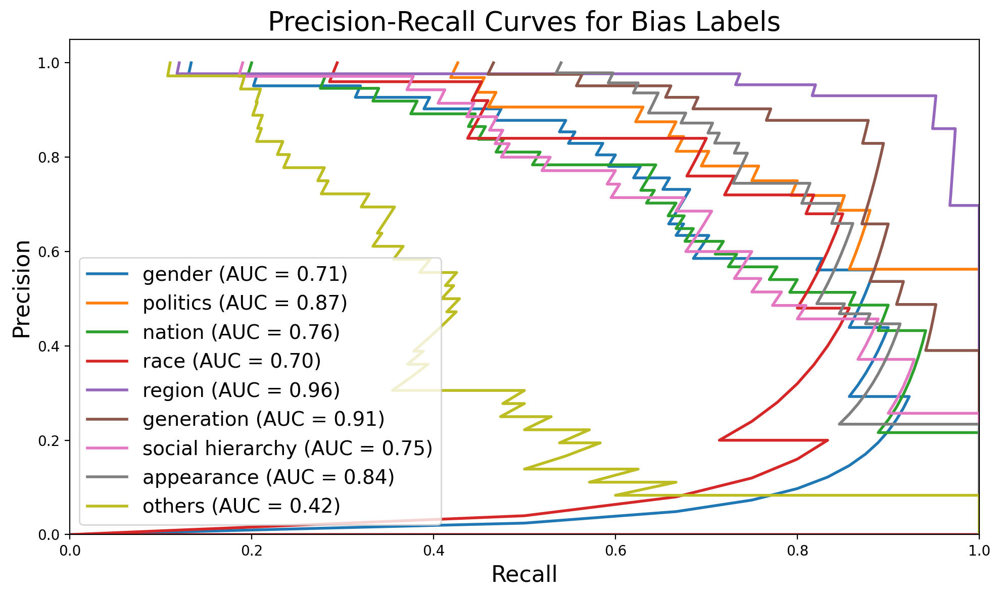


Eval results for Preference.
accuracy : 64.11
f1-macro : 63.84
preference_mae:0.45544554455445546
preference_top2_accuracy:0.8910890817642212
preference_top2_f1:0.6085709181508739

Eval results for Slang.
accuracy : 89.11
precision : 86.76
recall : 92.68
f1 : 89.62
matthews_corrcoef : 78.38
pr_auc : 0.954727303358951
roc_auc : 0.9479593087388161

Eval results for Gender.
accuracy : 92.33
precision : 58.62
recall : 82.93
f1 : 68.69
matthews_corrcoef : 65.72
pr_auc : 0.706536778278216
roc_auc : 0.9420815695760264

Eval results for Politic.
accuracy : 92.57
precision : 51.79
recall : 90.62
f1 : 65.91
matthews_corrcoef : 65.16
pr_auc : 0.8710500247907318
roc_auc : 0.9832829301075269

Eval results for Nation.
accuracy : 91.34
precision : 51.72
recall : 81.08
f1 : 63.16
matthews_corrcoef : 60.42
pr_auc : 0.7573850194824162
roc_auc : 0.9536048309890272

Eval results for Race.
accuracy : 92.57
precision : 44.9
recall : 88.0
f1 : 59.46
matthews_corrcoef : 59.69
pr_auc : 0.697374208696161
roc_a

epoch: 13, train loss: 5.7129: 100%|█████████████████████████████████████| 3836/3836 [35:05<00:00,  1.82it/s]


Preference Accuracy per class
Class 1: 70.32%
Class 2: 55.53%
Class 3: 71.10%
Class 4: 54.55%
Class 5: 49.72%


epoch: 13, valid loss: 9.6131: 100%|███████████████████████████████████████| 101/101 [00:10<00:00,  9.55it/s]


Preference Accuracy per class
Class 1: 91.46%
Class 2: 56.41%
Class 3: 53.47%
Class 4: 65.22%
Class 5: 63.51%


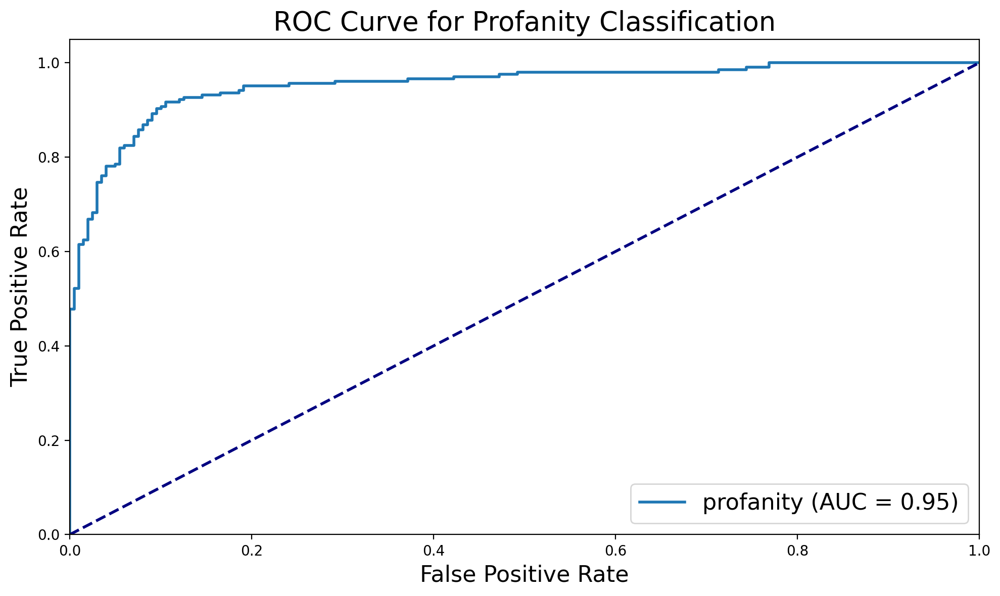

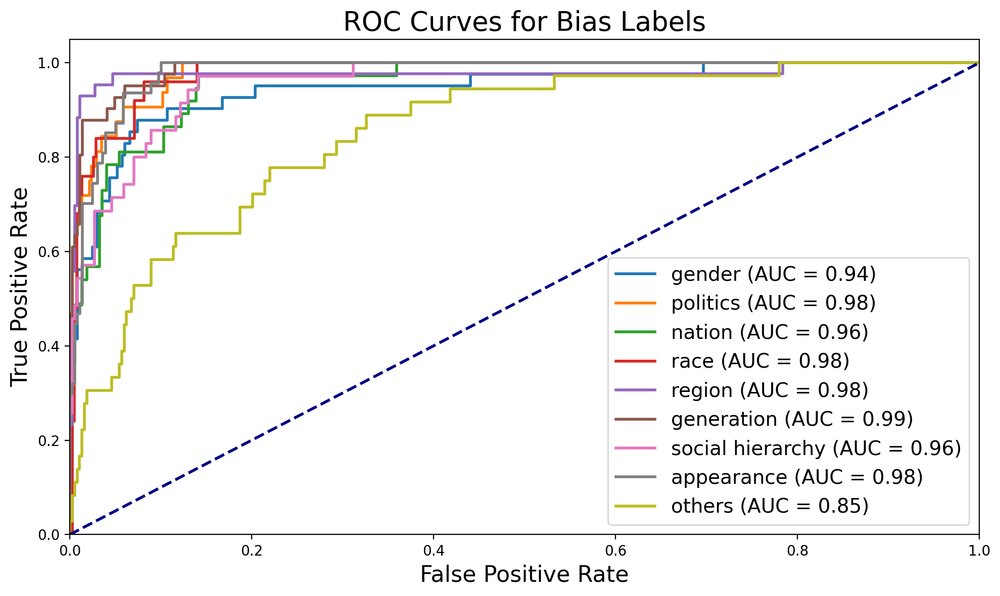

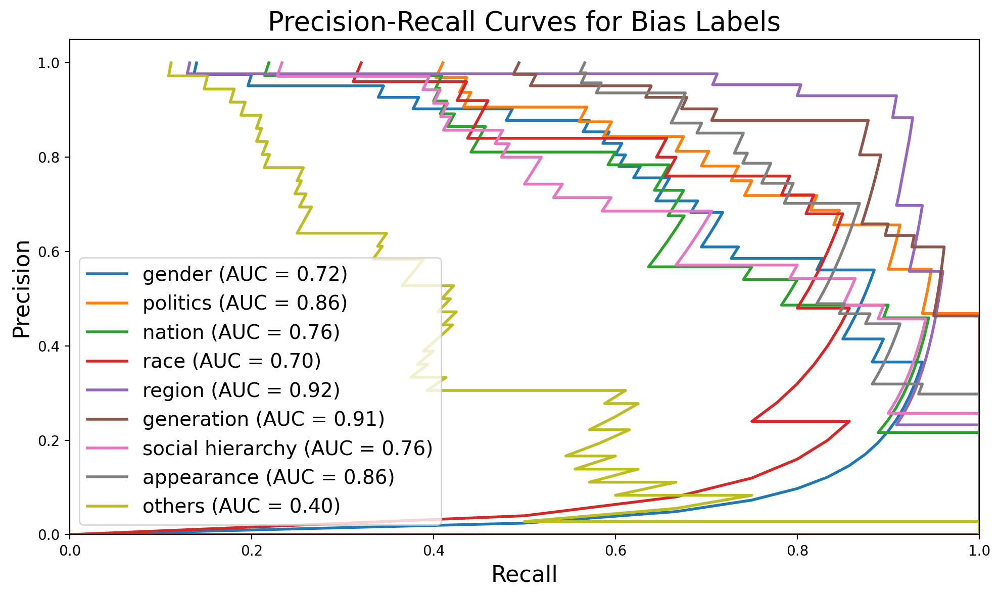


Eval results for Preference.
accuracy : 65.59
f1-macro : 65.37
preference_mae:0.45792079207920794
preference_top2_accuracy:0.8836633563041687
preference_top2_f1:0.6028906870428619

Eval results for Slang.
accuracy : 90.1
precision : 88.37
recall : 92.68
f1 : 90.48
matthews_corrcoef : 80.28
pr_auc : 0.9600401521170722
roc_auc : 0.9526657678637087

Eval results for Gender.
accuracy : 92.08
precision : 57.38
recall : 85.37
f1 : 68.63
matthews_corrcoef : 65.96
pr_auc : 0.7156447720291279
roc_auc : 0.944298864476248

Eval results for Politic.
accuracy : 93.81
precision : 57.14
recall : 87.5
f1 : 69.14
matthews_corrcoef : 67.71
pr_auc : 0.8589993537011833
roc_auc : 0.9811827956989247

Eval results for Nation.
accuracy : 91.58
precision : 52.63
recall : 81.08
f1 : 63.83
matthews_corrcoef : 61.09
pr_auc : 0.7606602557690365
roc_auc : 0.9590544222696811

Eval results for Race.
accuracy : 92.08
precision : 43.4
recall : 92.0
f1 : 58.97
matthews_corrcoef : 60.01
pr_auc : 0.7020659304132423
roc_a

epoch: 14, train loss: 5.1713: 100%|█████████████████████████████████████| 3836/3836 [34:35<00:00,  1.85it/s]


Preference Accuracy per class
Class 1: 70.26%
Class 2: 56.13%
Class 3: 70.55%
Class 4: 58.34%
Class 5: 53.86%


epoch: 14, valid loss: 10.5764: 100%|██████████████████████████████████████| 101/101 [00:10<00:00,  9.42it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 57.69%
Class 3: 57.43%
Class 4: 68.12%
Class 5: 66.22%


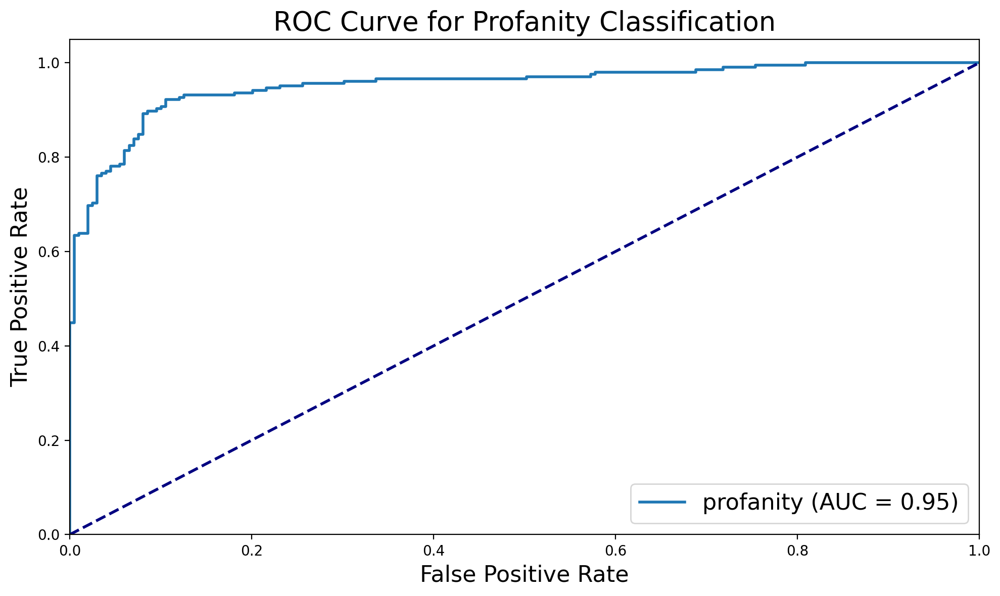

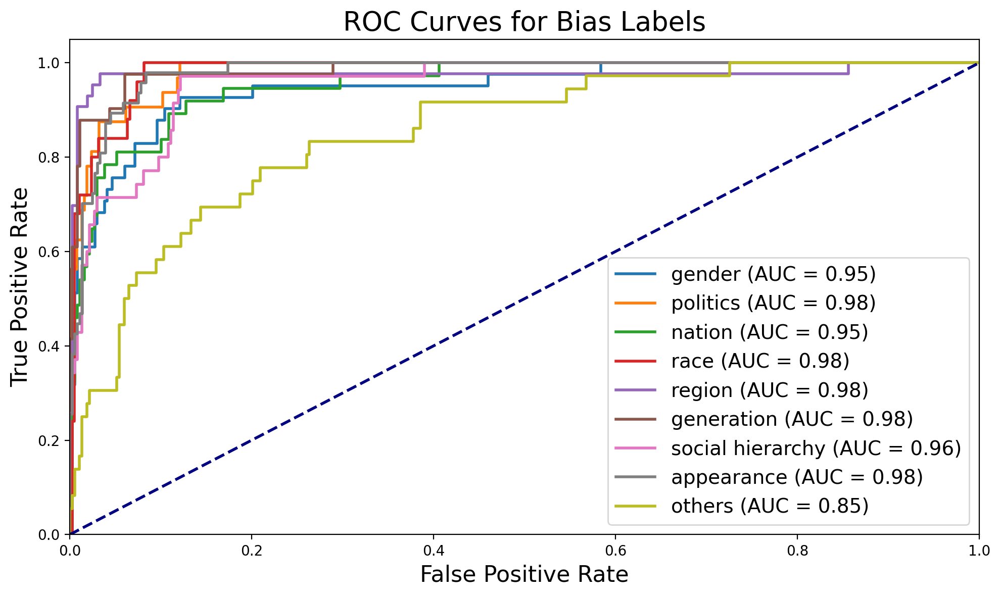

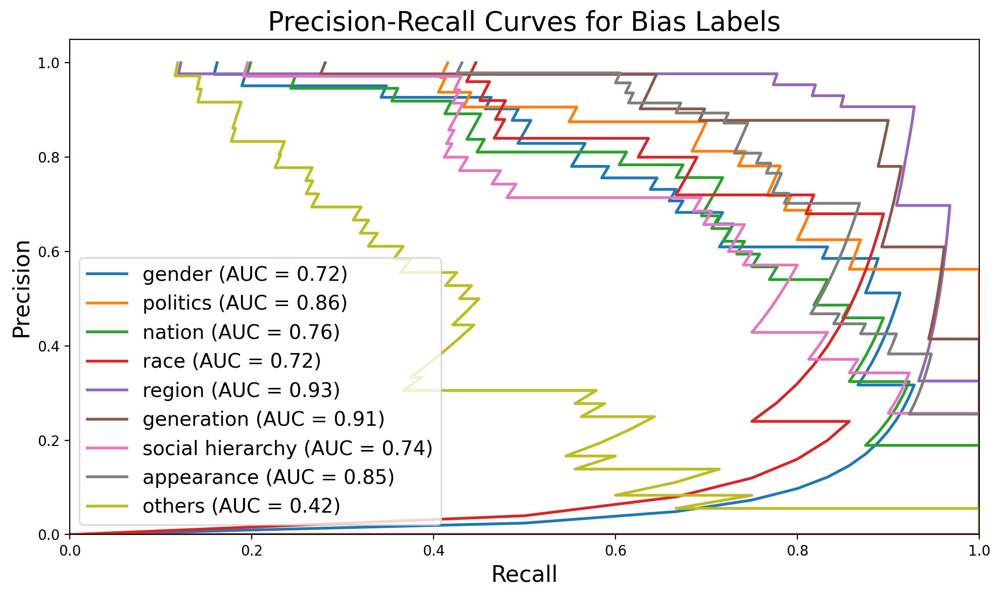


Eval results for Preference.
accuracy : 66.83
f1-macro : 66.78
preference_mae:0.42574257425742573
preference_top2_accuracy:0.8985148668289185
preference_top2_f1:0.6129761826057509

Eval results for Slang.
accuracy : 90.35
precision : 89.9
recall : 91.22
f1 : 90.56
matthews_corrcoef : 80.69
pr_auc : 0.960551857003194
roc_auc : 0.9521019732810393

Eval results for Gender.
accuracy : 92.08
precision : 58.18
recall : 78.05
f1 : 66.67
matthews_corrcoef : 63.15
pr_auc : 0.7169253416360047
roc_auc : 0.9463817778673654

Eval results for Politic.
accuracy : 94.31
precision : 59.57
recall : 87.5
f1 : 70.89
matthews_corrcoef : 69.4
pr_auc : 0.8629565781102682
roc_auc : 0.981602822580645

Eval results for Nation.
accuracy : 92.08
precision : 54.55
recall : 81.08
f1 : 65.22
matthews_corrcoef : 62.47
pr_auc : 0.7584140207826896
roc_auc : 0.9546358347448265

Eval results for Race.
accuracy : 93.32
precision : 47.83
recall : 88.0
f1 : 61.97
matthews_corrcoef : 61.95
pr_auc : 0.7156580057790616
roc_au

epoch: 15, train loss: 5.1821: 100%|█████████████████████████████████████| 3836/3836 [33:52<00:00,  1.89it/s]


Preference Accuracy per class
Class 1: 72.09%
Class 2: 55.60%
Class 3: 71.14%
Class 4: 59.19%
Class 5: 52.17%


epoch: 15, valid loss: 10.3159: 100%|██████████████████████████████████████| 101/101 [00:09<00:00, 10.11it/s]


Preference Accuracy per class
Class 1: 92.68%
Class 2: 62.82%
Class 3: 55.45%
Class 4: 68.12%
Class 5: 72.97%


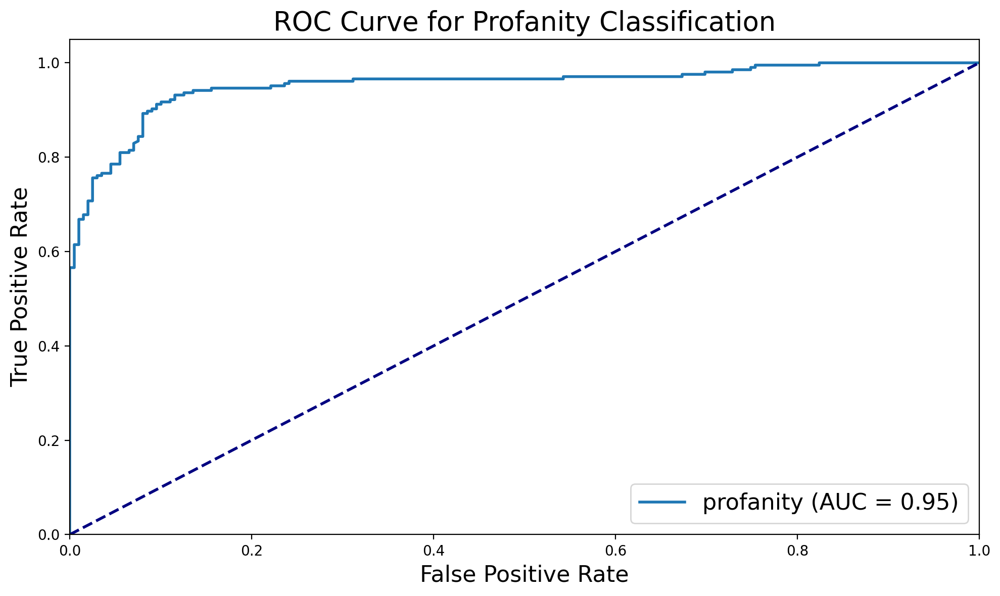

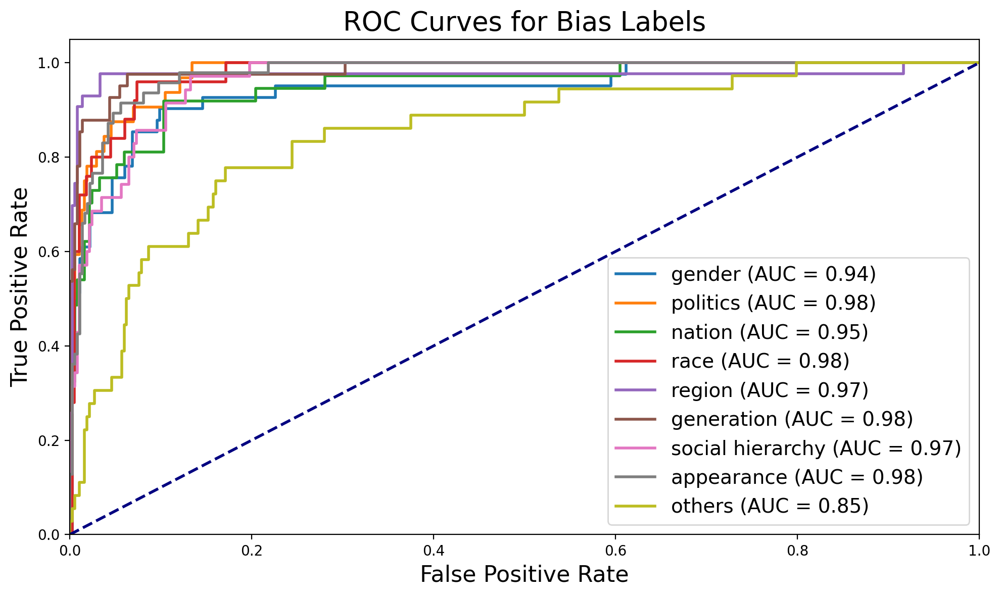

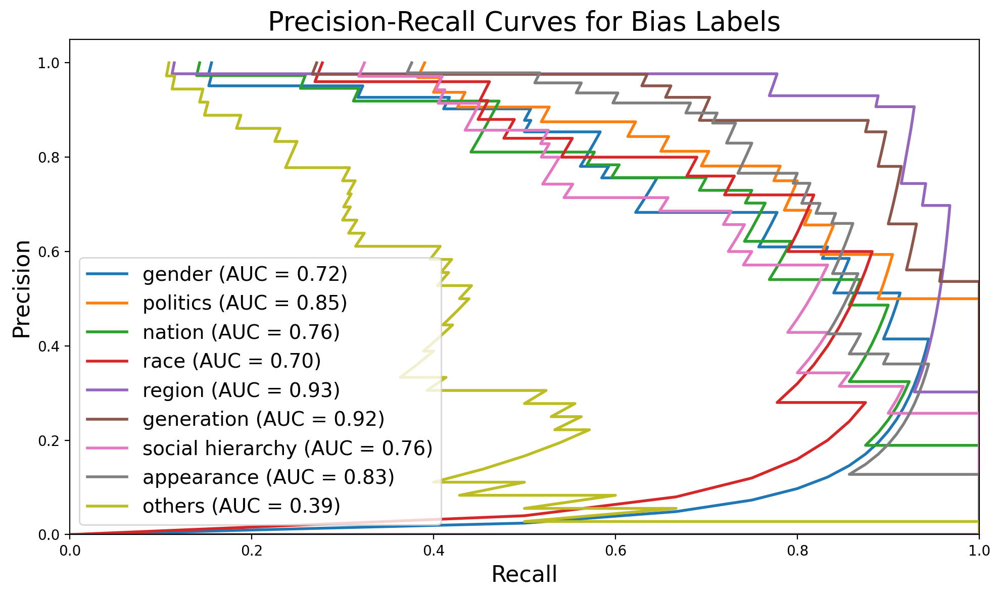


Eval results for Preference.
accuracy : 69.8
f1-macro : 69.54
preference_mae:0.3935643564356436
preference_top2_accuracy:0.8985148668289185
preference_top2_f1:0.6115683101377352

Eval results for Slang.
accuracy : 90.84
precision : 90.38
recall : 91.71
f1 : 91.04
matthews_corrcoef : 81.68
pr_auc : 0.9629576282286707
roc_auc : 0.953192793234465

Eval results for Gender.
accuracy : 92.08
precision : 58.49
recall : 75.61
f1 : 65.96
matthews_corrcoef : 62.21
pr_auc : 0.7217082101619825
roc_auc : 0.942350332594235

Eval results for Politic.
accuracy : 94.55
precision : 60.87
recall : 87.5
f1 : 71.79
matthews_corrcoef : 70.28
pr_auc : 0.8514873656869935
roc_auc : 0.9798387096774193

Eval results for Nation.
accuracy : 90.35
precision : 48.39
recall : 81.08
f1 : 60.61
matthews_corrcoef : 57.91
pr_auc : 0.7645466373837114
roc_auc : 0.9499963178437294

Eval results for Race.
accuracy : 93.07
precision : 46.81
recall : 88.0
f1 : 61.11
matthews_corrcoef : 61.17
pr_auc : 0.7043269061939819
roc_au

epoch: 16, train loss: 5.3571: 100%|█████████████████████████████████████| 3836/3836 [30:04<00:00,  2.13it/s]


Preference Accuracy per class
Class 1: 71.62%
Class 2: 56.59%
Class 3: 70.75%
Class 4: 60.83%
Class 5: 57.06%


epoch: 16, valid loss: 10.3016: 100%|██████████████████████████████████████| 101/101 [00:09<00:00, 10.71it/s]


Preference Accuracy per class
Class 1: 92.68%
Class 2: 58.97%
Class 3: 49.50%
Class 4: 73.91%
Class 5: 67.57%


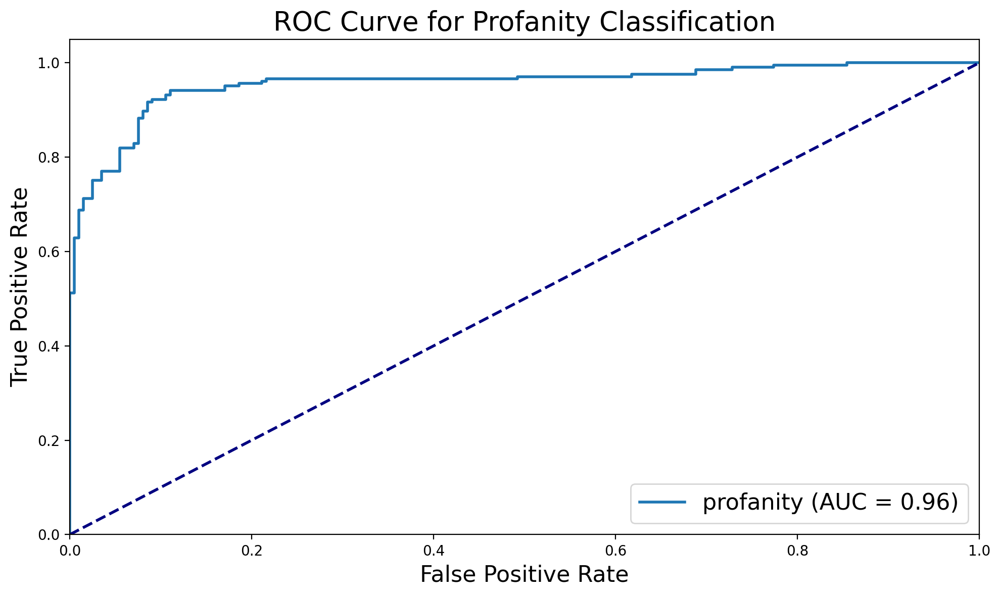

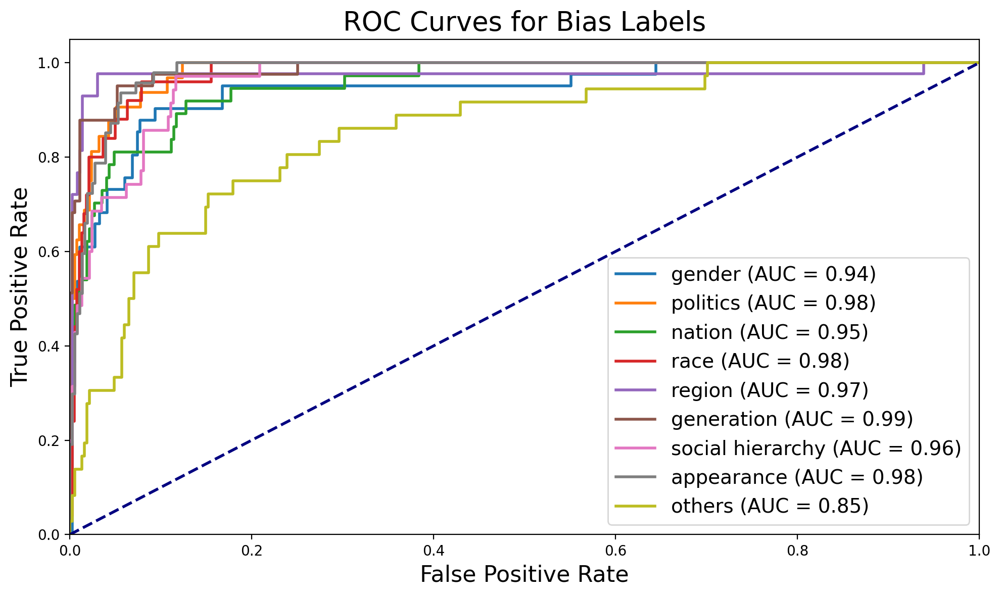

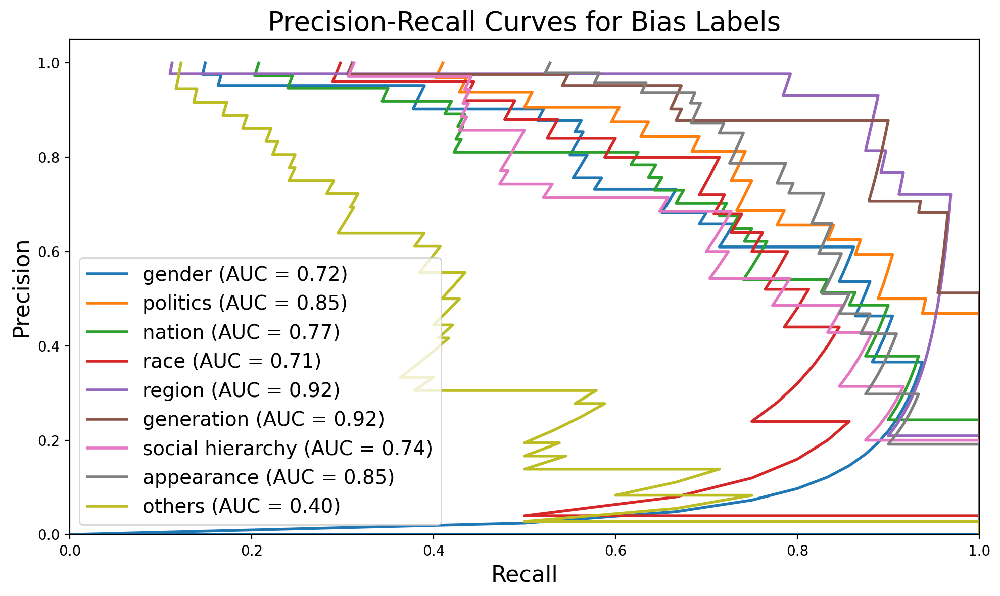


Eval results for Preference.
accuracy : 67.57
f1-macro : 67.39
preference_mae:0.41089108910891087
preference_top2_accuracy:0.896039605140686
preference_top2_f1:0.6095975340912079

Eval results for Slang.
accuracy : 91.34
precision : 90.87
recall : 92.2
f1 : 91.53
matthews_corrcoef : 82.67
pr_auc : 0.9645417718573023
roc_auc : 0.9556808432405932

Eval results for Gender.
accuracy : 91.83
precision : 57.41
recall : 75.61
f1 : 65.26
matthews_corrcoef : 61.47
pr_auc : 0.7156247298284991
roc_auc : 0.9428878586306524

Eval results for Politic.
accuracy : 94.8
precision : 62.79
recall : 84.38
f1 : 72.0
matthews_corrcoef : 70.12
pr_auc : 0.8541714070008937
roc_auc : 0.9818548387096773

Eval results for Nation.
accuracy : 92.57
precision : 56.6
recall : 81.08
f1 : 66.67
matthews_corrcoef : 63.92
pr_auc : 0.766785153982837
roc_auc : 0.9543412622431696

Eval results for Race.
accuracy : 93.07
precision : 46.94
recall : 92.0
f1 : 62.16
matthews_corrcoef : 62.84
pr_auc : 0.714461993107895
roc_auc 

epoch: 17, train loss: 5.0187: 100%|█████████████████████████████████████| 3836/3836 [29:58<00:00,  2.13it/s]


Preference Accuracy per class
Class 1: 72.41%
Class 2: 57.19%
Class 3: 70.38%
Class 4: 62.63%
Class 5: 59.51%


epoch: 17, valid loss: 10.5635: 100%|██████████████████████████████████████| 101/101 [00:09<00:00, 10.62it/s]


Preference Accuracy per class
Class 1: 92.68%
Class 2: 60.26%
Class 3: 53.47%
Class 4: 76.81%
Class 5: 66.22%


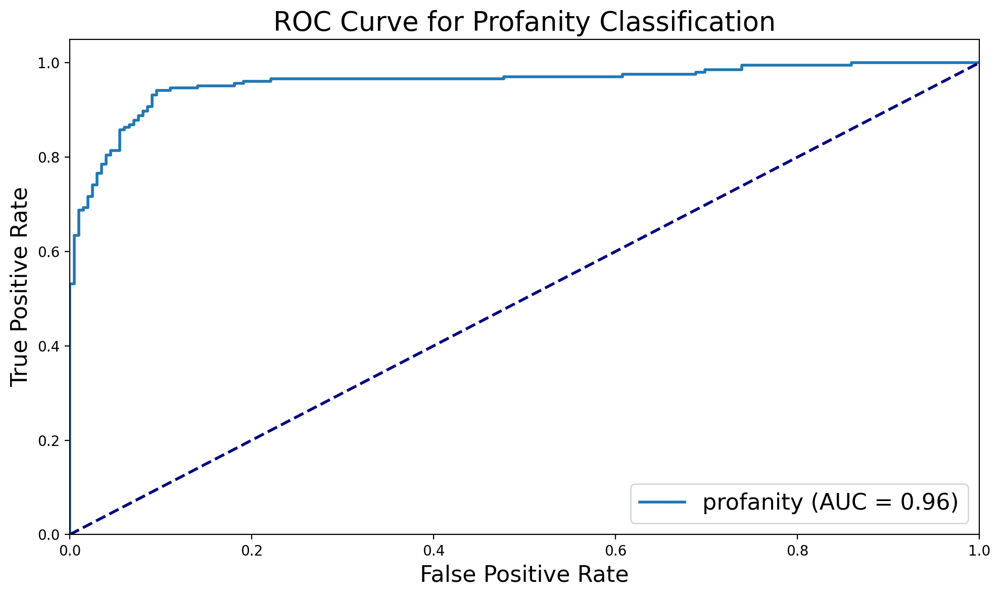

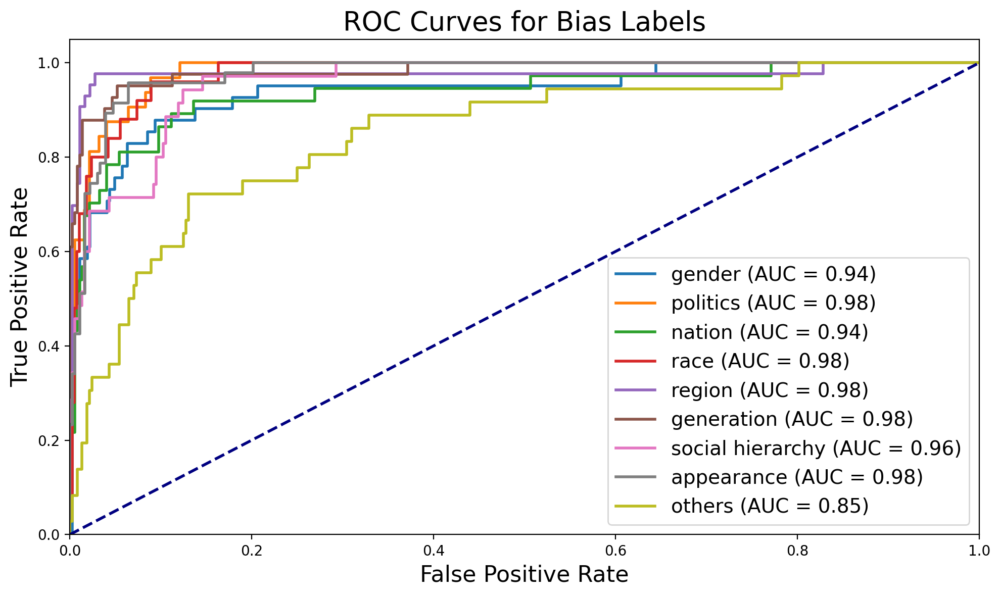

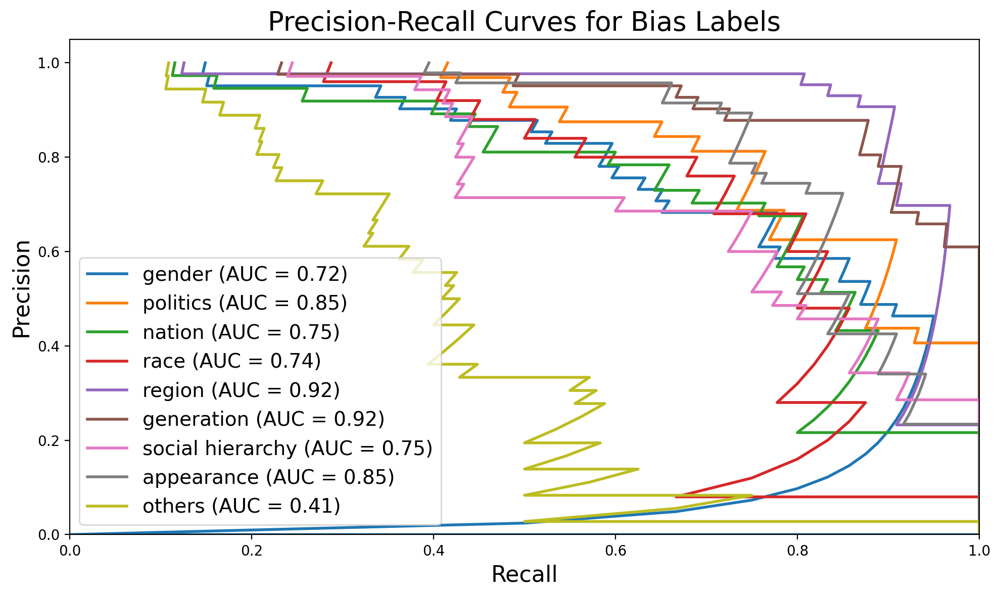


Eval results for Preference.
accuracy : 69.06
f1-macro : 68.96
preference_mae:0.3910891089108911
preference_top2_accuracy:0.905940592288971
preference_top2_f1:0.6185188946149027

Eval results for Slang.
accuracy : 91.58
precision : 91.3
recall : 92.2
f1 : 91.75
matthews_corrcoef : 83.17
pr_auc : 0.9670543410732522
roc_auc : 0.9583282264983455

Eval results for Gender.
accuracy : 92.08
precision : 58.18
recall : 78.05
f1 : 66.67
matthews_corrcoef : 63.15
pr_auc : 0.7205818262938029
roc_auc : 0.9401330376940132

Eval results for Politic.
accuracy : 94.8
precision : 62.22
recall : 87.5
f1 : 72.73
matthews_corrcoef : 71.19
pr_auc : 0.8470373418209455
roc_auc : 0.9817708333333334

Eval results for Nation.
accuracy : 92.57
precision : 56.6
recall : 81.08
f1 : 66.67
matthews_corrcoef : 63.92
pr_auc : 0.7523442166735156
roc_auc : 0.9367405552691656

Eval results for Race.
accuracy : 94.31
precision : 52.5
recall : 84.0
f1 : 64.62
matthews_corrcoef : 63.72
pr_auc : 0.7402811176095663
roc_auc :

epoch: 18, train loss: 4.9254: 100%|█████████████████████████████████████| 3836/3836 [30:08<00:00,  2.12it/s]


Preference Accuracy per class
Class 1: 71.65%
Class 2: 57.58%
Class 3: 71.38%
Class 4: 63.03%
Class 5: 57.82%


epoch: 18, valid loss: 10.5989: 100%|██████████████████████████████████████| 101/101 [00:09<00:00, 10.36it/s]


Preference Accuracy per class
Class 1: 90.24%
Class 2: 64.10%
Class 3: 58.42%
Class 4: 78.26%
Class 5: 72.97%


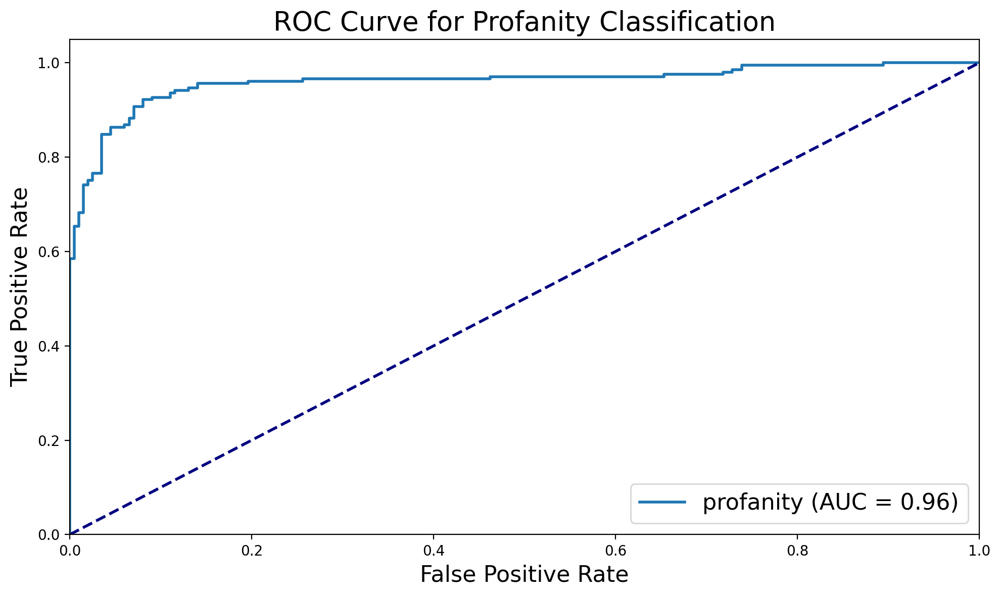

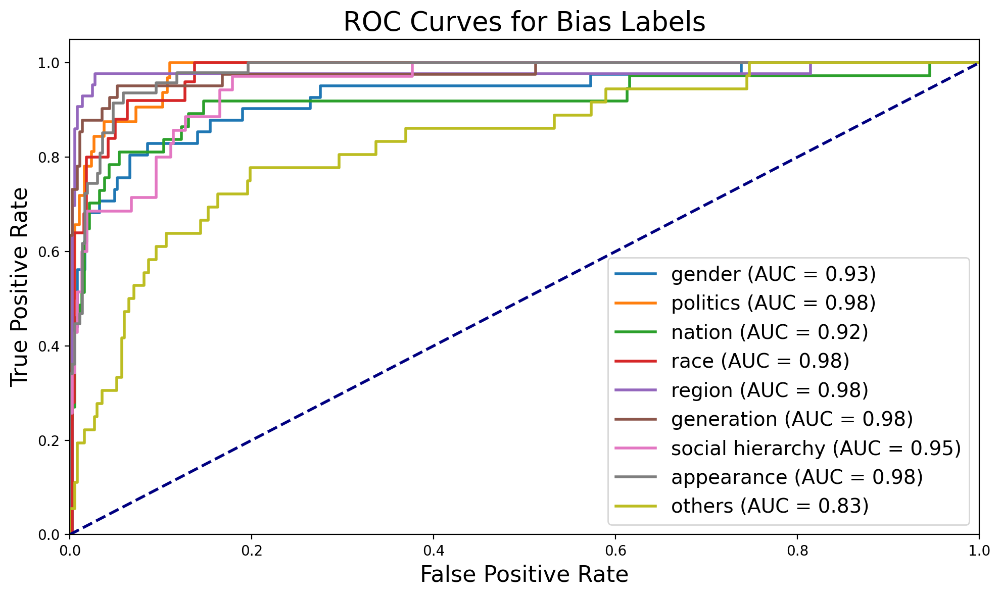

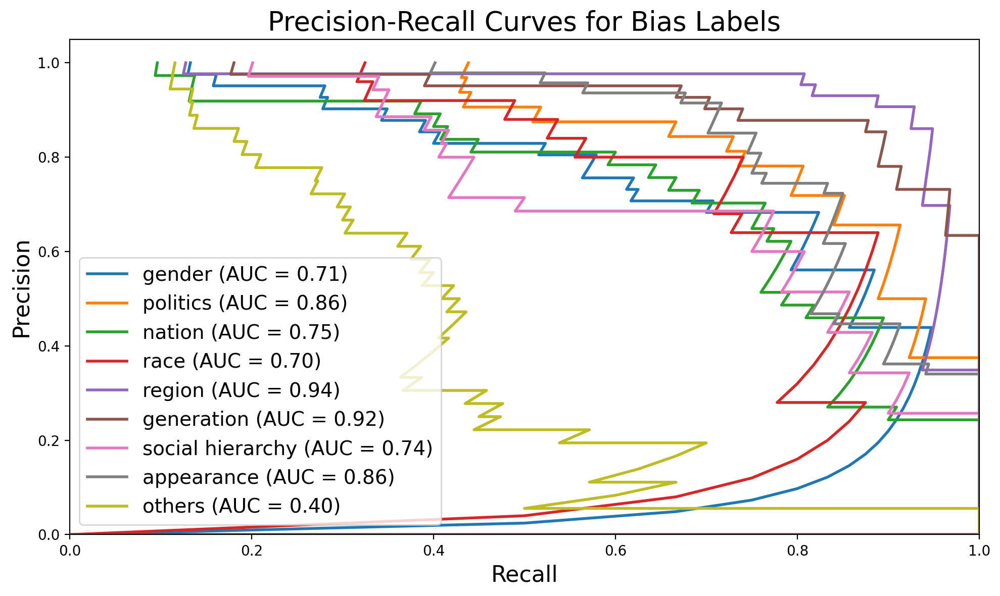


Eval results for Preference.
accuracy : 72.03
f1-macro : 72.1
preference_mae:0.36386138613861385
preference_top2_accuracy:0.896039605140686
preference_top2_f1:0.6119503154279111

Eval results for Slang.
accuracy : 92.08
precision : 92.2
recall : 92.2
f1 : 92.2
matthews_corrcoef : 84.15
pr_auc : 0.9694300068493713
roc_auc : 0.9598235077828166

Eval results for Gender.
accuracy : 92.82
precision : 62.5
recall : 73.17
f1 : 67.42
matthews_corrcoef : 63.66
pr_auc : 0.706661053289974
roc_auc : 0.9301888060202916

Eval results for Politic.
accuracy : 95.3
precision : 65.12
recall : 87.5
f1 : 74.67
matthews_corrcoef : 73.09
pr_auc : 0.8586915449471892
roc_auc : 0.9821068548387096

Eval results for Nation.
accuracy : 94.06
precision : 64.44
recall : 78.38
f1 : 70.73
matthews_corrcoef : 67.86
pr_auc : 0.7452694664677885
roc_auc : 0.9178142720377053

Eval results for Race.
accuracy : 93.56
precision : 48.94
recall : 92.0
f1 : 63.89
matthews_corrcoef : 64.38
pr_auc : 0.7036140771652919
roc_auc : 

epoch: 19, train loss: 4.7725: 100%|█████████████████████████████████████| 3836/3836 [29:58<00:00,  2.13it/s]


Preference Accuracy per class
Class 1: 73.09%
Class 2: 58.26%
Class 3: 71.23%
Class 4: 63.93%
Class 5: 61.39%


epoch: 19, valid loss: 11.3319: 100%|██████████████████████████████████████| 101/101 [00:09<00:00, 10.26it/s]


Preference Accuracy per class
Class 1: 91.46%
Class 2: 56.41%
Class 3: 49.50%
Class 4: 79.71%
Class 5: 67.57%


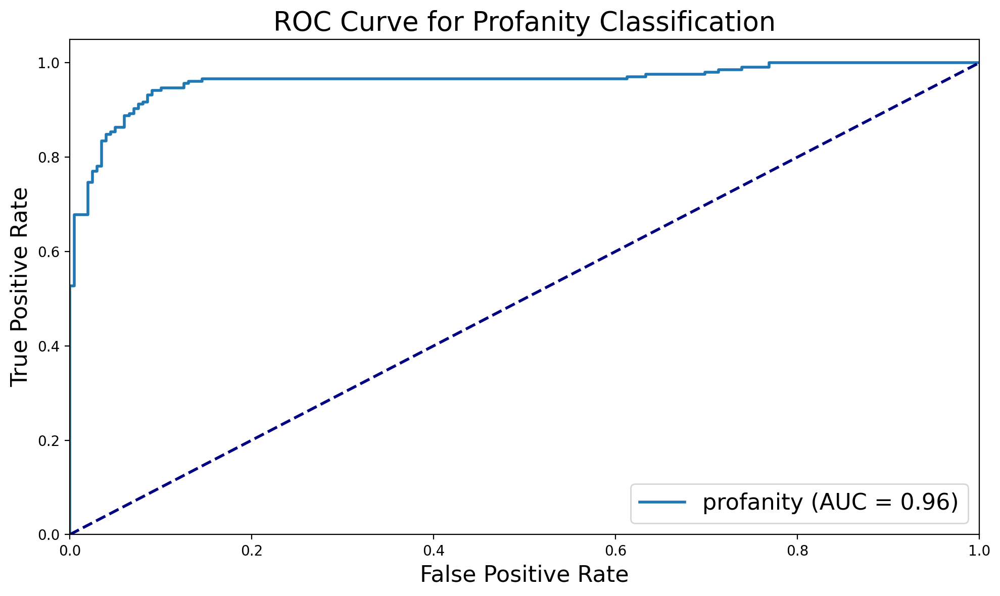

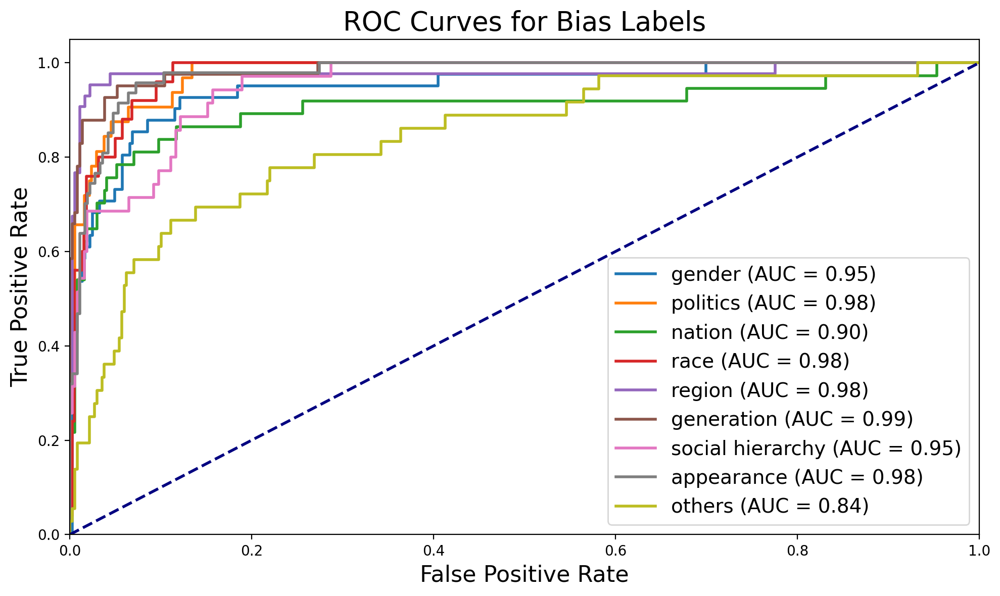

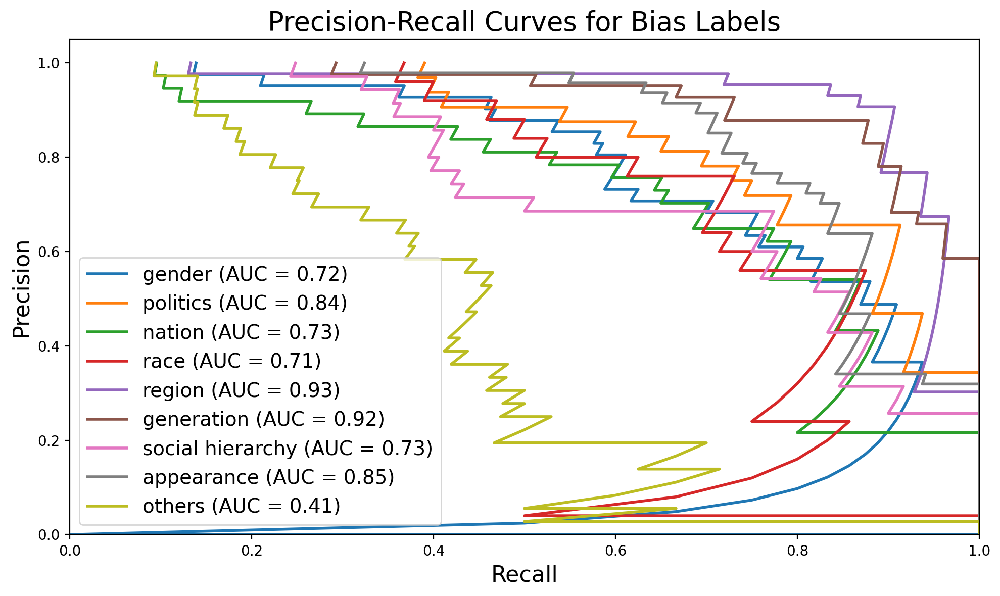


Eval results for Preference.
accuracy : 67.82
f1-macro : 67.69
preference_mae:0.400990099009901
preference_top2_accuracy:0.8886138796806335
preference_top2_f1:0.6066264948358377

Eval results for Slang.
accuracy : 92.08
precision : 91.79
recall : 92.68
f1 : 92.23
matthews_corrcoef : 84.16
pr_auc : 0.9698039786661935
roc_auc : 0.9609020713322711

Eval results for Gender.
accuracy : 92.33
precision : 58.93
recall : 80.49
f1 : 68.04
matthews_corrcoef : 64.8
pr_auc : 0.7207547818261162
roc_auc : 0.9462473963582612

Eval results for Politic.
accuracy : 94.55
precision : 60.87
recall : 87.5
f1 : 71.79
matthews_corrcoef : 70.28
pr_auc : 0.8395918891813217
roc_auc : 0.9790826612903225

Eval results for Nation.
accuracy : 93.81
precision : 63.64
recall : 75.68
f1 : 69.14
matthews_corrcoef : 66.03
pr_auc : 0.7289477238067055
roc_auc : 0.9046321525885559

Eval results for Race.
accuracy : 94.06
precision : 51.28
recall : 80.0
f1 : 62.5
matthews_corrcoef : 61.18
pr_auc : 0.7119929503286715
roc_au

epoch: 20, train loss: 4.6192: 100%|█████████████████████████████████████| 3836/3836 [30:11<00:00,  2.12it/s]


Preference Accuracy per class
Class 1: 72.89%
Class 2: 58.67%
Class 3: 71.32%
Class 4: 65.40%
Class 5: 62.34%


epoch: 20, valid loss: 12.4514: 100%|██████████████████████████████████████| 101/101 [00:10<00:00,  9.84it/s]


Preference Accuracy per class
Class 1: 93.90%
Class 2: 55.13%
Class 3: 56.44%
Class 4: 75.36%
Class 5: 71.62%


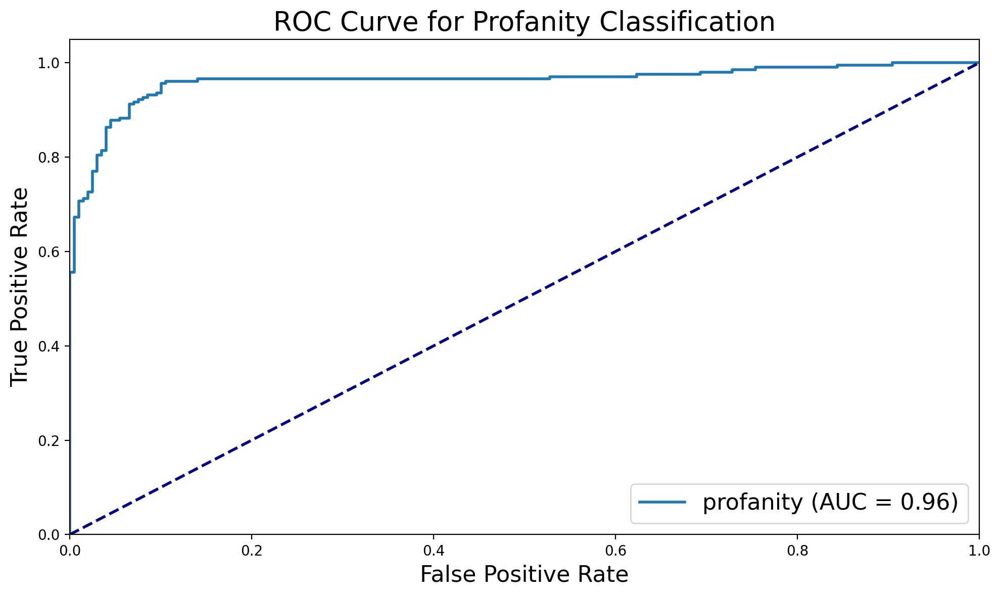

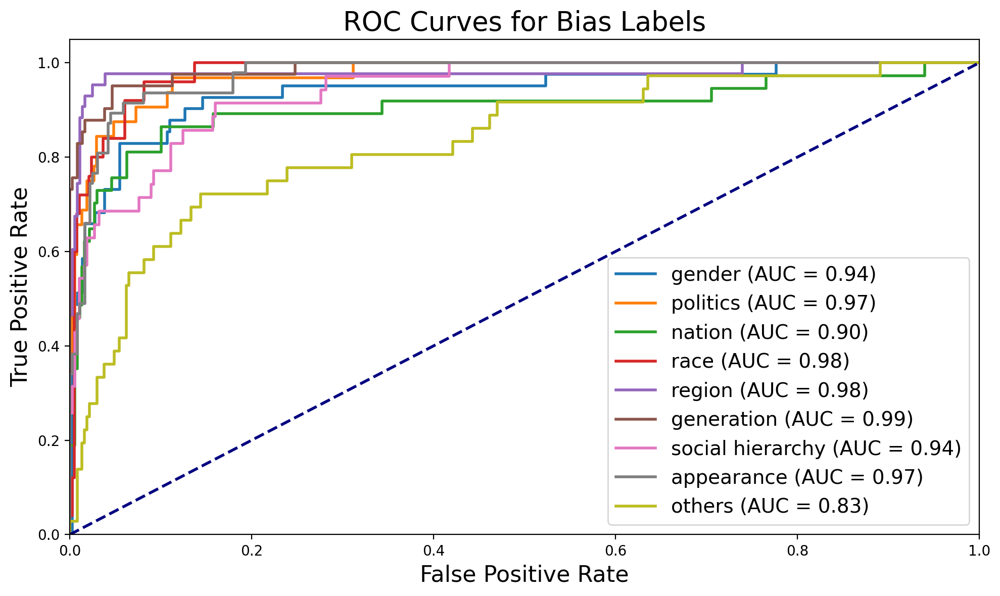

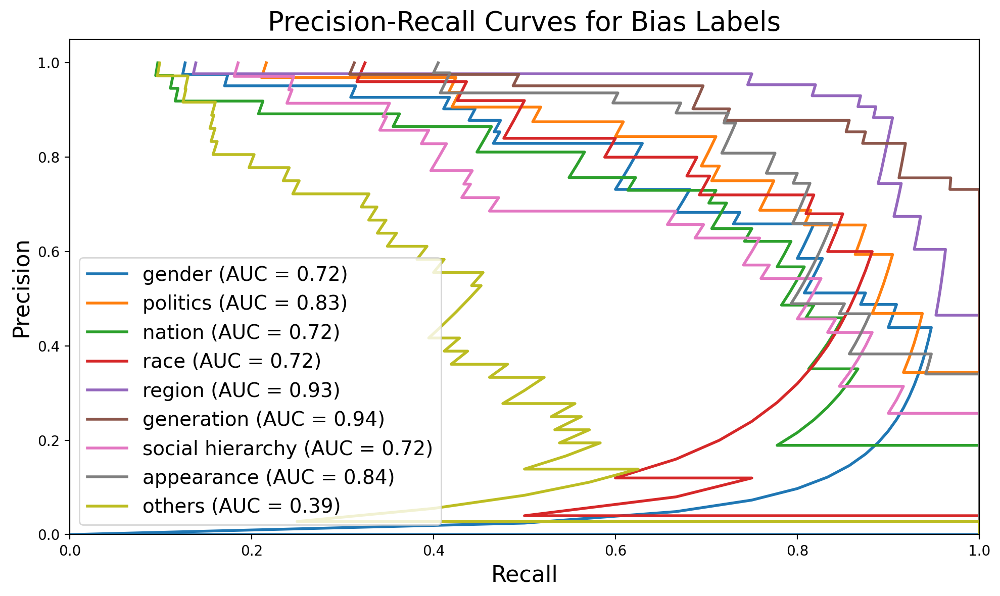


Eval results for Preference.
accuracy : 69.8
f1-macro : 69.6
preference_mae:0.3787128712871287
preference_top2_accuracy:0.9084158539772034
preference_top2_f1:0.6202236391810058

Eval results for Slang.
accuracy : 92.08
precision : 90.61
recall : 94.15
f1 : 92.34
matthews_corrcoef : 84.21
pr_auc : 0.971056863871756
roc_auc : 0.9615148915308249

Eval results for Gender.
accuracy : 91.83
precision : 56.67
recall : 82.93
f1 : 67.33
matthews_corrcoef : 64.34
pr_auc : 0.7192787735412138
roc_auc : 0.9387892226029698

Eval results for Politic.
accuracy : 94.55
precision : 61.36
recall : 84.38
f1 : 71.05
matthews_corrcoef : 69.18
pr_auc : 0.8332561223181476
roc_auc : 0.9737903225806452

Eval results for Nation.
accuracy : 93.32
precision : 60.87
recall : 75.68
f1 : 67.47
matthews_corrcoef : 64.26
pr_auc : 0.7161971439483371
roc_auc : 0.9042639369614847

Eval results for Race.
accuracy : 93.56
precision : 48.84
recall : 84.0
f1 : 61.76
matthews_corrcoef : 61.09
pr_auc : 0.7216326255819157
roc_a

In [21]:
train_losses = []
val_f1 = []
val_roc_auc= []
val_accuracy = []
val_mae = []
val_top2_acc = []
val_top2_f1 = []
val_pr_auc = []
best_avg_score = 0

if config.do_train:
    best_score = [0] * 11
    # Start training over a number of epochs
    for epoch in range(config.num_train_epochs):
        train_results = run_epoch(loader=train_dataloader, epoch=epoch, is_train=True, **params)
        train_loss = train_results['loss']
        train_losses.append(train_loss)
        
        # Optionally evaluate model during training
        if config.do_eval_during_train:
            eval_results = do_eval(epoch)
            
            # Store evaluation metrics
            val_f1.append(tuple(eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)))
            val_roc_auc.append(tuple(eval_results[i]["roc_auc"] for i in range(1, 11)))
            val_accuracy.append(tuple(eval_results[i]["accuracy"] for i in range(11)))
            val_mae.append(eval_results[11])
            val_top2_acc.append(eval_results[12])
            val_top2_f1.append(eval_results[13])
            val_pr_auc.append(tuple(eval_results[-10:]))
            
            # Check and store best model based on average F1 score
            current_score = [eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)]
            current_avg_score = sum(current_score) / len(current_score)  
            if current_avg_score >= best_avg_score:
                best_avg_score = current_avg_score
                output_dir = os.path.join(config.output_dir, config.task, config.dataset, f"{epoch}-best-ckpt")
                # Save best model
                copy.deepcopy(
                    model_dp.module if hasattr(model_dp, "module") else model_dp._models[0] if hasattr(model_dp, "_models") else model_dp
                ).cpu().save_pretrained(output_dir)
                # Save configuration of best model
                with open(os.path.join(output_dir, "finetune_config.json"), "w") as save_config:
                    json.dump(vars(config), save_config, sort_keys=True, indent=4)
                print(f"Checkpoint {output_dir} saved.")             

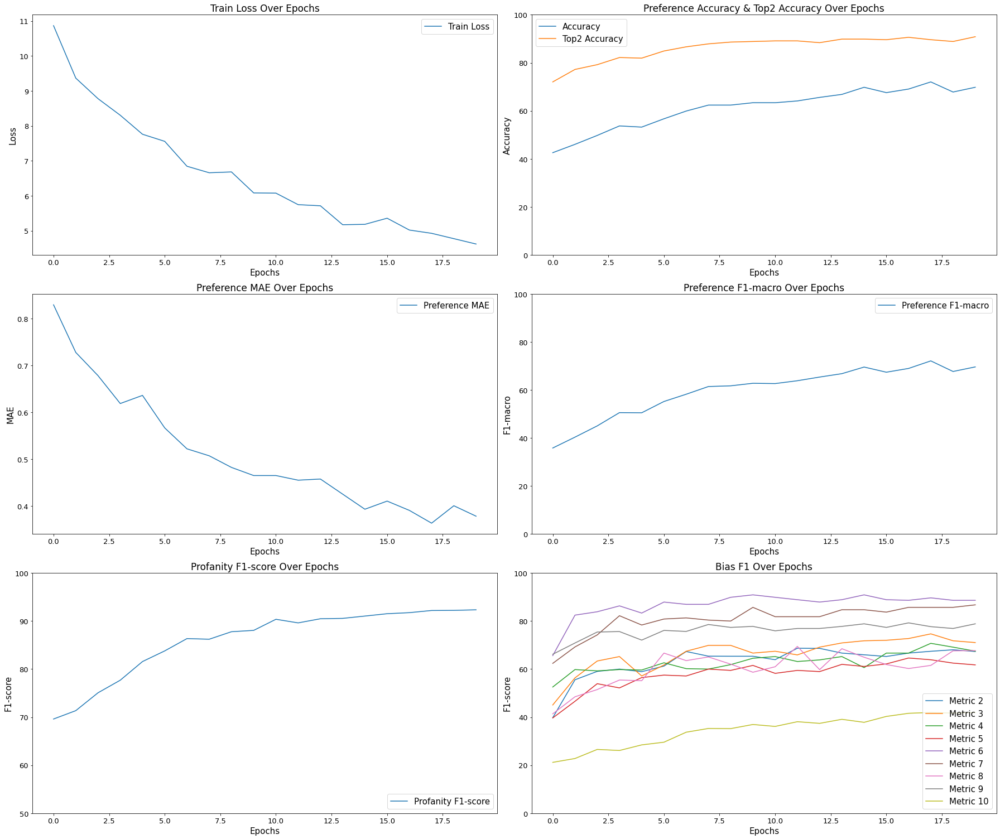

In [25]:
import numpy as npii
import matplotlib.pyplot as plt

# Create a 3x2 grid for the subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(25, 21))

# 1. Train Loss Over Epochs
axs[0, 0].plot(train_losses, label='Train Loss')
axs[0, 0].set_xlabel('Epochs', fontsize=15)
axs[0, 0].set_ylabel('Loss', fontsize=15)
axs[0, 0].set_title('Train Loss Over Epochs', fontsize=17)
axs[0, 0].legend(fontsize=15)
axs[0, 0].tick_params(axis='both', labelsize=13)
axs[0, 0].grid(False)

# 2. Preference Accuracy & Top2 Accuracy Over Epochs
val_accuracy = np.array(val_accuracy)
val_top2_accuracy = np.array(val_top2_acc) * 100
axs[0, 1].plot(val_accuracy[:, 0], label='Accuracy', linestyle='-')
axs[0, 1].plot(val_top2_accuracy, label='Top2 Accuracy', linestyle='-')
axs[0, 1].set_xlabel('Epochs', fontsize=15)
axs[0, 1].set_ylabel('Accuracy', fontsize=15)
axs[0, 1].set_ylim(0, 100)
axs[0, 1].set_title('Preference Accuracy & Top2 Accuracy Over Epochs', fontsize=17)
axs[0, 1].legend(fontsize=15)
axs[0, 1].tick_params(axis='both', labelsize=13)
axs[0, 1].grid(False)

# 3. Preference MAE Over Epochs
val_mae = np.array(val_mae)
axs[1, 0].plot(val_mae, label='Preference MAE', linestyle='-')
axs[1, 0].set_xlabel('Epochs', fontsize=15)
axs[1, 0].set_ylabel('MAE', fontsize=15)
axs[1, 0].set_title('Preference MAE Over Epochs', fontsize=17)
axs[1, 0].legend(fontsize=15)
axs[1, 0].tick_params(axis='both', labelsize=13)
axs[1, 0].grid(False)

# 4. Preference F1-macro Over Epochs
result = [val_f1[i][0] for i in range(config.num_train_epochs)]
axs[1, 1].plot(result, label='Preference F1-macro', linestyle='-')
axs[1, 1].set_xlabel('Epochs', fontsize=15)
axs[1, 1].set_ylabel('F1-macro', fontsize=15)
axs[1, 1].set_ylim(0, 100)
axs[1, 1].set_title('Preference F1-macro Over Epochs', fontsize=17)
axs[1, 1].legend(fontsize=15)
axs[1, 1].tick_params(axis='both', labelsize=13)
axs[1, 1].grid(False)

# 5. Profanity Metrics Over Epochs
result = [val_f1[i][1] for i in range(config.num_train_epochs)]
axs[2, 0].plot(result, label='Profanity F1-score', linestyle='-')
axs[2, 0].set_xlabel('Epochs', fontsize=15)
axs[2, 0].set_ylabel('F1-score', fontsize=15)
axs[2, 0].set_ylim(50, 100)
axs[2, 0].set_title('Profanity F1-score Over Epochs', fontsize=17)
axs[2, 0].legend(loc="lower right", fontsize=15)
axs[2, 0].tick_params(axis='both', labelsize=13)
axs[2, 0].grid(False)

# 6. Bias F1-score Over Epochs
for j in range(2, 11):
    result = [val_f1[i][j] for i in range(config.num_train_epochs)]
    axs[2, 1].plot(result, label=f'Metric {j}', linestyle='-')
    axs[2, 1].set_xlabel('Epochs', fontsize=15)
    axs[2, 1].set_ylabel('F1-score', fontsize=15)
    axs[2, 1].set_ylim(0, 100)
    axs[2, 1].set_title('Bias F1 Over Epochs', fontsize=17)
    axs[2, 1].legend(loc="lower right", fontsize=15)
    axs[2, 1].tick_params(axis='both', labelsize=13)
    axs[2, 1].grid(False)

plt.tight_layout()
#plt.savefig('combined_plots.pdf', format='pdf')
plt.show()